# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [1]:
# run this once to unzip the file
!unzip processed-celeba-small.zip

Archive:  processed-celeba-small.zip
   creating: processed_celeba_small/
  inflating: processed_celeba_small/.DS_Store  
   creating: __MACOSX/
   creating: __MACOSX/processed_celeba_small/
  inflating: __MACOSX/processed_celeba_small/._.DS_Store  
   creating: processed_celeba_small/celeba/
  inflating: processed_celeba_small/celeba/.DS_Store  
   creating: __MACOSX/processed_celeba_small/celeba/
  inflating: __MACOSX/processed_celeba_small/celeba/._.DS_Store  
  inflating: processed_celeba_small/celeba/161979.jpg  
  inflating: processed_celeba_small/celeba/161980.jpg  
  inflating: processed_celeba_small/celeba/161981.jpg  
  inflating: processed_celeba_small/celeba/161982.jpg  
  inflating: processed_celeba_small/celeba/161983.jpg  
  inflating: processed_celeba_small/celeba/161984.jpg  
  inflating: processed_celeba_small/celeba/161985.jpg  
  inflating: processed_celeba_small/celeba/161986.jpg  
  inflating: processed_celeba_small/celeba/161987.jpg  
  inflating: processed_celeb

  inflating: processed_celeba_small/celeba/162387.jpg  
  inflating: processed_celeba_small/celeba/162388.jpg  
  inflating: processed_celeba_small/celeba/162389.jpg  
  inflating: processed_celeba_small/celeba/162390.jpg  
  inflating: processed_celeba_small/celeba/162391.jpg  
  inflating: processed_celeba_small/celeba/162392.jpg  
  inflating: processed_celeba_small/celeba/162393.jpg  
  inflating: processed_celeba_small/celeba/162394.jpg  
  inflating: processed_celeba_small/celeba/162395.jpg  
  inflating: processed_celeba_small/celeba/162396.jpg  
  inflating: processed_celeba_small/celeba/162397.jpg  
  inflating: processed_celeba_small/celeba/162398.jpg  
  inflating: processed_celeba_small/celeba/162399.jpg  
  inflating: processed_celeba_small/celeba/162400.jpg  
  inflating: processed_celeba_small/celeba/162401.jpg  
  inflating: processed_celeba_small/celeba/162402.jpg  
  inflating: processed_celeba_small/celeba/162403.jpg  
  inflating: processed_celeba_small/celeba/16240

  inflating: processed_celeba_small/celeba/162795.jpg  
  inflating: processed_celeba_small/celeba/162796.jpg  
  inflating: processed_celeba_small/celeba/162797.jpg  
  inflating: processed_celeba_small/celeba/162798.jpg  
  inflating: processed_celeba_small/celeba/162799.jpg  
  inflating: processed_celeba_small/celeba/162800.jpg  
  inflating: processed_celeba_small/celeba/162801.jpg  
  inflating: processed_celeba_small/celeba/162802.jpg  
  inflating: processed_celeba_small/celeba/162803.jpg  
  inflating: processed_celeba_small/celeba/162804.jpg  
  inflating: processed_celeba_small/celeba/162805.jpg  
  inflating: processed_celeba_small/celeba/162806.jpg  
  inflating: processed_celeba_small/celeba/162807.jpg  
  inflating: processed_celeba_small/celeba/162808.jpg  
  inflating: processed_celeba_small/celeba/162809.jpg  
  inflating: processed_celeba_small/celeba/162810.jpg  
  inflating: processed_celeba_small/celeba/162811.jpg  
  inflating: processed_celeba_small/celeba/16281

  inflating: processed_celeba_small/celeba/163339.jpg  
  inflating: processed_celeba_small/celeba/163340.jpg  
  inflating: processed_celeba_small/celeba/163341.jpg  
  inflating: processed_celeba_small/celeba/163342.jpg  
  inflating: processed_celeba_small/celeba/163343.jpg  
  inflating: processed_celeba_small/celeba/163344.jpg  
  inflating: processed_celeba_small/celeba/163345.jpg  
  inflating: processed_celeba_small/celeba/163346.jpg  
  inflating: processed_celeba_small/celeba/163347.jpg  
  inflating: processed_celeba_small/celeba/163348.jpg  
  inflating: processed_celeba_small/celeba/163349.jpg  
  inflating: processed_celeba_small/celeba/163350.jpg  
  inflating: processed_celeba_small/celeba/163351.jpg  
  inflating: processed_celeba_small/celeba/163352.jpg  
  inflating: processed_celeba_small/celeba/163353.jpg  
  inflating: processed_celeba_small/celeba/163354.jpg  
  inflating: processed_celeba_small/celeba/163355.jpg  
  inflating: processed_celeba_small/celeba/16335

  inflating: processed_celeba_small/celeba/163661.jpg  
  inflating: processed_celeba_small/celeba/163662.jpg  
  inflating: processed_celeba_small/celeba/163663.jpg  
  inflating: processed_celeba_small/celeba/163664.jpg  
  inflating: processed_celeba_small/celeba/163665.jpg  
  inflating: processed_celeba_small/celeba/163666.jpg  
  inflating: processed_celeba_small/celeba/163667.jpg  
  inflating: processed_celeba_small/celeba/163668.jpg  
  inflating: processed_celeba_small/celeba/163669.jpg  
  inflating: processed_celeba_small/celeba/163670.jpg  
  inflating: processed_celeba_small/celeba/163671.jpg  
  inflating: processed_celeba_small/celeba/163672.jpg  
  inflating: processed_celeba_small/celeba/163673.jpg  
  inflating: processed_celeba_small/celeba/163674.jpg  
  inflating: processed_celeba_small/celeba/163675.jpg  
  inflating: processed_celeba_small/celeba/163676.jpg  
  inflating: processed_celeba_small/celeba/163677.jpg  
  inflating: processed_celeba_small/celeba/16367

  inflating: processed_celeba_small/celeba/164224.jpg  
  inflating: processed_celeba_small/celeba/164225.jpg  
  inflating: processed_celeba_small/celeba/164226.jpg  
  inflating: processed_celeba_small/celeba/164227.jpg  
  inflating: processed_celeba_small/celeba/164228.jpg  
  inflating: processed_celeba_small/celeba/164229.jpg  
  inflating: processed_celeba_small/celeba/164230.jpg  
  inflating: processed_celeba_small/celeba/164231.jpg  
  inflating: processed_celeba_small/celeba/164232.jpg  
  inflating: processed_celeba_small/celeba/164233.jpg  
  inflating: processed_celeba_small/celeba/164234.jpg  
  inflating: processed_celeba_small/celeba/164235.jpg  
  inflating: processed_celeba_small/celeba/164236.jpg  
  inflating: processed_celeba_small/celeba/164237.jpg  
  inflating: processed_celeba_small/celeba/164238.jpg  
  inflating: processed_celeba_small/celeba/164239.jpg  
  inflating: processed_celeba_small/celeba/164240.jpg  
  inflating: processed_celeba_small/celeba/16424

  inflating: processed_celeba_small/celeba/164563.jpg  
  inflating: processed_celeba_small/celeba/164564.jpg  
  inflating: processed_celeba_small/celeba/164565.jpg  
  inflating: processed_celeba_small/celeba/164566.jpg  
  inflating: processed_celeba_small/celeba/164567.jpg  
  inflating: processed_celeba_small/celeba/164568.jpg  
  inflating: processed_celeba_small/celeba/164569.jpg  
  inflating: processed_celeba_small/celeba/164570.jpg  
  inflating: processed_celeba_small/celeba/164571.jpg  
  inflating: processed_celeba_small/celeba/164572.jpg  
  inflating: processed_celeba_small/celeba/164573.jpg  
  inflating: processed_celeba_small/celeba/164574.jpg  
  inflating: processed_celeba_small/celeba/164575.jpg  
  inflating: processed_celeba_small/celeba/164576.jpg  
  inflating: processed_celeba_small/celeba/164577.jpg  
  inflating: processed_celeba_small/celeba/164578.jpg  
  inflating: processed_celeba_small/celeba/164579.jpg  
  inflating: processed_celeba_small/celeba/16458

  inflating: processed_celeba_small/celeba/165104.jpg  
  inflating: processed_celeba_small/celeba/165105.jpg  
  inflating: processed_celeba_small/celeba/165106.jpg  
  inflating: processed_celeba_small/celeba/165107.jpg  
  inflating: processed_celeba_small/celeba/165108.jpg  
  inflating: processed_celeba_small/celeba/165109.jpg  
  inflating: processed_celeba_small/celeba/165110.jpg  
  inflating: processed_celeba_small/celeba/165111.jpg  
  inflating: processed_celeba_small/celeba/165112.jpg  
  inflating: processed_celeba_small/celeba/165113.jpg  
  inflating: processed_celeba_small/celeba/165114.jpg  
  inflating: processed_celeba_small/celeba/165115.jpg  
  inflating: processed_celeba_small/celeba/165116.jpg  
  inflating: processed_celeba_small/celeba/165117.jpg  
  inflating: processed_celeba_small/celeba/165118.jpg  
  inflating: processed_celeba_small/celeba/165119.jpg  
  inflating: processed_celeba_small/celeba/165120.jpg  
  inflating: processed_celeba_small/celeba/16512

  inflating: processed_celeba_small/celeba/165663.jpg  
  inflating: processed_celeba_small/celeba/165664.jpg  
  inflating: processed_celeba_small/celeba/165665.jpg  
  inflating: processed_celeba_small/celeba/165666.jpg  
  inflating: processed_celeba_small/celeba/165667.jpg  
  inflating: processed_celeba_small/celeba/165668.jpg  
  inflating: processed_celeba_small/celeba/165669.jpg  
  inflating: processed_celeba_small/celeba/165670.jpg  
  inflating: processed_celeba_small/celeba/165671.jpg  
  inflating: processed_celeba_small/celeba/165672.jpg  
  inflating: processed_celeba_small/celeba/165673.jpg  
  inflating: processed_celeba_small/celeba/165674.jpg  
  inflating: processed_celeba_small/celeba/165675.jpg  
  inflating: processed_celeba_small/celeba/165676.jpg  
  inflating: processed_celeba_small/celeba/165677.jpg  
  inflating: processed_celeba_small/celeba/165678.jpg  
  inflating: processed_celeba_small/celeba/165679.jpg  
  inflating: processed_celeba_small/celeba/16568

  inflating: processed_celeba_small/celeba/165998.jpg  
  inflating: processed_celeba_small/celeba/165999.jpg  
  inflating: processed_celeba_small/celeba/166000.jpg  
  inflating: processed_celeba_small/celeba/166001.jpg  
  inflating: processed_celeba_small/celeba/166002.jpg  
  inflating: processed_celeba_small/celeba/166003.jpg  
  inflating: processed_celeba_small/celeba/166004.jpg  
  inflating: processed_celeba_small/celeba/166005.jpg  
  inflating: processed_celeba_small/celeba/166006.jpg  
  inflating: processed_celeba_small/celeba/166007.jpg  
  inflating: processed_celeba_small/celeba/166008.jpg  
  inflating: processed_celeba_small/celeba/166009.jpg  
  inflating: processed_celeba_small/celeba/166010.jpg  
  inflating: processed_celeba_small/celeba/166011.jpg  
  inflating: processed_celeba_small/celeba/166012.jpg  
  inflating: processed_celeba_small/celeba/166013.jpg  
  inflating: processed_celeba_small/celeba/166014.jpg  
  inflating: processed_celeba_small/celeba/16601

  inflating: processed_celeba_small/celeba/166557.jpg  
  inflating: processed_celeba_small/celeba/166558.jpg  
  inflating: processed_celeba_small/celeba/166559.jpg  
  inflating: processed_celeba_small/celeba/166560.jpg  
  inflating: processed_celeba_small/celeba/166561.jpg  
  inflating: processed_celeba_small/celeba/166562.jpg  
  inflating: processed_celeba_small/celeba/166563.jpg  
  inflating: processed_celeba_small/celeba/166564.jpg  
  inflating: processed_celeba_small/celeba/166565.jpg  
  inflating: processed_celeba_small/celeba/166566.jpg  
  inflating: processed_celeba_small/celeba/166567.jpg  
  inflating: processed_celeba_small/celeba/166568.jpg  
  inflating: processed_celeba_small/celeba/166569.jpg  
  inflating: processed_celeba_small/celeba/166570.jpg  
  inflating: processed_celeba_small/celeba/166571.jpg  
  inflating: processed_celeba_small/celeba/166572.jpg  
  inflating: processed_celeba_small/celeba/166573.jpg  
  inflating: processed_celeba_small/celeba/16657

  inflating: processed_celeba_small/celeba/166889.jpg  
  inflating: processed_celeba_small/celeba/166890.jpg  
  inflating: processed_celeba_small/celeba/166891.jpg  
  inflating: processed_celeba_small/celeba/166892.jpg  
  inflating: processed_celeba_small/celeba/166893.jpg  
  inflating: processed_celeba_small/celeba/166894.jpg  
  inflating: processed_celeba_small/celeba/166895.jpg  
  inflating: processed_celeba_small/celeba/166896.jpg  
  inflating: processed_celeba_small/celeba/166897.jpg  
  inflating: processed_celeba_small/celeba/166898.jpg  
  inflating: processed_celeba_small/celeba/166899.jpg  
  inflating: processed_celeba_small/celeba/166900.jpg  
  inflating: processed_celeba_small/celeba/166901.jpg  
  inflating: processed_celeba_small/celeba/166902.jpg  
  inflating: processed_celeba_small/celeba/166903.jpg  
  inflating: processed_celeba_small/celeba/166904.jpg  
  inflating: processed_celeba_small/celeba/166905.jpg  
  inflating: processed_celeba_small/celeba/16690

  inflating: processed_celeba_small/celeba/167420.jpg  
  inflating: processed_celeba_small/celeba/167421.jpg  
  inflating: processed_celeba_small/celeba/167422.jpg  
  inflating: processed_celeba_small/celeba/167423.jpg  
  inflating: processed_celeba_small/celeba/167424.jpg  
  inflating: processed_celeba_small/celeba/167425.jpg  
  inflating: processed_celeba_small/celeba/167426.jpg  
  inflating: processed_celeba_small/celeba/167427.jpg  
  inflating: processed_celeba_small/celeba/167428.jpg  
  inflating: processed_celeba_small/celeba/167429.jpg  
  inflating: processed_celeba_small/celeba/167430.jpg  
  inflating: processed_celeba_small/celeba/167431.jpg  
  inflating: processed_celeba_small/celeba/167432.jpg  
  inflating: processed_celeba_small/celeba/167433.jpg  
  inflating: processed_celeba_small/celeba/167434.jpg  
  inflating: processed_celeba_small/celeba/167435.jpg  
  inflating: processed_celeba_small/celeba/167436.jpg  
  inflating: processed_celeba_small/celeba/16743

  inflating: processed_celeba_small/celeba/167726.jpg  
  inflating: processed_celeba_small/celeba/167727.jpg  
  inflating: processed_celeba_small/celeba/167728.jpg  
  inflating: processed_celeba_small/celeba/167729.jpg  
  inflating: processed_celeba_small/celeba/167730.jpg  
  inflating: processed_celeba_small/celeba/167731.jpg  
  inflating: processed_celeba_small/celeba/167732.jpg  
  inflating: processed_celeba_small/celeba/167733.jpg  
  inflating: processed_celeba_small/celeba/167734.jpg  
  inflating: processed_celeba_small/celeba/167735.jpg  
  inflating: processed_celeba_small/celeba/167736.jpg  
  inflating: processed_celeba_small/celeba/167737.jpg  
  inflating: processed_celeba_small/celeba/167738.jpg  
  inflating: processed_celeba_small/celeba/167739.jpg  
  inflating: processed_celeba_small/celeba/167740.jpg  
  inflating: processed_celeba_small/celeba/167741.jpg  
  inflating: processed_celeba_small/celeba/167742.jpg  
  inflating: processed_celeba_small/celeba/16774

  inflating: processed_celeba_small/celeba/168263.jpg  
  inflating: processed_celeba_small/celeba/168264.jpg  
  inflating: processed_celeba_small/celeba/168265.jpg  
  inflating: processed_celeba_small/celeba/168266.jpg  
  inflating: processed_celeba_small/celeba/168267.jpg  
  inflating: processed_celeba_small/celeba/168268.jpg  
  inflating: processed_celeba_small/celeba/168269.jpg  
  inflating: processed_celeba_small/celeba/168270.jpg  
  inflating: processed_celeba_small/celeba/168271.jpg  
  inflating: processed_celeba_small/celeba/168272.jpg  
  inflating: processed_celeba_small/celeba/168273.jpg  
  inflating: processed_celeba_small/celeba/168274.jpg  
  inflating: processed_celeba_small/celeba/168275.jpg  
  inflating: processed_celeba_small/celeba/168276.jpg  
  inflating: processed_celeba_small/celeba/168277.jpg  
  inflating: processed_celeba_small/celeba/168278.jpg  
  inflating: processed_celeba_small/celeba/168279.jpg  
  inflating: processed_celeba_small/celeba/16828

  inflating: processed_celeba_small/celeba/168579.jpg  
  inflating: processed_celeba_small/celeba/168580.jpg  
  inflating: processed_celeba_small/celeba/168581.jpg  
  inflating: processed_celeba_small/celeba/168582.jpg  
  inflating: processed_celeba_small/celeba/168583.jpg  
  inflating: processed_celeba_small/celeba/168584.jpg  
  inflating: processed_celeba_small/celeba/168585.jpg  
  inflating: processed_celeba_small/celeba/168586.jpg  
  inflating: processed_celeba_small/celeba/168587.jpg  
  inflating: processed_celeba_small/celeba/168588.jpg  
  inflating: processed_celeba_small/celeba/168589.jpg  
  inflating: processed_celeba_small/celeba/168590.jpg  
  inflating: processed_celeba_small/celeba/168591.jpg  
  inflating: processed_celeba_small/celeba/168592.jpg  
  inflating: processed_celeba_small/celeba/168593.jpg  
  inflating: processed_celeba_small/celeba/168594.jpg  
  inflating: processed_celeba_small/celeba/168595.jpg  
  inflating: processed_celeba_small/celeba/16859

  inflating: processed_celeba_small/celeba/169126.jpg  
  inflating: processed_celeba_small/celeba/169127.jpg  
  inflating: processed_celeba_small/celeba/169128.jpg  
  inflating: processed_celeba_small/celeba/169129.jpg  
  inflating: processed_celeba_small/celeba/169130.jpg  
  inflating: processed_celeba_small/celeba/169131.jpg  
  inflating: processed_celeba_small/celeba/169132.jpg  
  inflating: processed_celeba_small/celeba/169133.jpg  
  inflating: processed_celeba_small/celeba/169134.jpg  
  inflating: processed_celeba_small/celeba/169135.jpg  
  inflating: processed_celeba_small/celeba/169136.jpg  
  inflating: processed_celeba_small/celeba/169137.jpg  
  inflating: processed_celeba_small/celeba/169138.jpg  
  inflating: processed_celeba_small/celeba/169139.jpg  
  inflating: processed_celeba_small/celeba/169140.jpg  
  inflating: processed_celeba_small/celeba/169141.jpg  
  inflating: processed_celeba_small/celeba/169142.jpg  
  inflating: processed_celeba_small/celeba/16914

  inflating: processed_celeba_small/celeba/169473.jpg  
  inflating: processed_celeba_small/celeba/169474.jpg  
  inflating: processed_celeba_small/celeba/169475.jpg  
  inflating: processed_celeba_small/celeba/169476.jpg  
  inflating: processed_celeba_small/celeba/169477.jpg  
  inflating: processed_celeba_small/celeba/169478.jpg  
  inflating: processed_celeba_small/celeba/169479.jpg  
  inflating: processed_celeba_small/celeba/169480.jpg  
  inflating: processed_celeba_small/celeba/169481.jpg  
  inflating: processed_celeba_small/celeba/169482.jpg  
  inflating: processed_celeba_small/celeba/169483.jpg  
  inflating: processed_celeba_small/celeba/169484.jpg  
  inflating: processed_celeba_small/celeba/169485.jpg  
  inflating: processed_celeba_small/celeba/169486.jpg  
  inflating: processed_celeba_small/celeba/169487.jpg  
  inflating: processed_celeba_small/celeba/169488.jpg  
  inflating: processed_celeba_small/celeba/169489.jpg  
  inflating: processed_celeba_small/celeba/16949

  inflating: processed_celeba_small/celeba/170019.jpg  
  inflating: processed_celeba_small/celeba/170020.jpg  
  inflating: processed_celeba_small/celeba/170021.jpg  
  inflating: processed_celeba_small/celeba/170022.jpg  
  inflating: processed_celeba_small/celeba/170023.jpg  
  inflating: processed_celeba_small/celeba/170024.jpg  
  inflating: processed_celeba_small/celeba/170025.jpg  
  inflating: processed_celeba_small/celeba/170026.jpg  
  inflating: processed_celeba_small/celeba/170027.jpg  
  inflating: processed_celeba_small/celeba/170028.jpg  
  inflating: processed_celeba_small/celeba/170029.jpg  
  inflating: processed_celeba_small/celeba/170030.jpg  
  inflating: processed_celeba_small/celeba/170031.jpg  
  inflating: processed_celeba_small/celeba/170032.jpg  
  inflating: processed_celeba_small/celeba/170033.jpg  
  inflating: processed_celeba_small/celeba/170034.jpg  
  inflating: processed_celeba_small/celeba/170035.jpg  
  inflating: processed_celeba_small/celeba/17003

  inflating: processed_celeba_small/celeba/170352.jpg  
  inflating: processed_celeba_small/celeba/170353.jpg  
  inflating: processed_celeba_small/celeba/170354.jpg  
  inflating: processed_celeba_small/celeba/170355.jpg  
  inflating: processed_celeba_small/celeba/170356.jpg  
  inflating: processed_celeba_small/celeba/170357.jpg  
  inflating: processed_celeba_small/celeba/170358.jpg  
  inflating: processed_celeba_small/celeba/170359.jpg  
  inflating: processed_celeba_small/celeba/170360.jpg  
  inflating: processed_celeba_small/celeba/170361.jpg  
  inflating: processed_celeba_small/celeba/170362.jpg  
  inflating: processed_celeba_small/celeba/170363.jpg  
  inflating: processed_celeba_small/celeba/170364.jpg  
  inflating: processed_celeba_small/celeba/170365.jpg  
  inflating: processed_celeba_small/celeba/170366.jpg  
  inflating: processed_celeba_small/celeba/170367.jpg  
  inflating: processed_celeba_small/celeba/170368.jpg  
  inflating: processed_celeba_small/celeba/17036

  inflating: processed_celeba_small/celeba/170898.jpg  
  inflating: processed_celeba_small/celeba/170899.jpg  
  inflating: processed_celeba_small/celeba/170900.jpg  
  inflating: processed_celeba_small/celeba/170901.jpg  
  inflating: processed_celeba_small/celeba/170902.jpg  
  inflating: processed_celeba_small/celeba/170903.jpg  
  inflating: processed_celeba_small/celeba/170904.jpg  
  inflating: processed_celeba_small/celeba/170905.jpg  
  inflating: processed_celeba_small/celeba/170906.jpg  
  inflating: processed_celeba_small/celeba/170907.jpg  
  inflating: processed_celeba_small/celeba/170908.jpg  
  inflating: processed_celeba_small/celeba/170909.jpg  
  inflating: processed_celeba_small/celeba/170910.jpg  
  inflating: processed_celeba_small/celeba/170911.jpg  
  inflating: processed_celeba_small/celeba/170912.jpg  
  inflating: processed_celeba_small/celeba/170913.jpg  
  inflating: processed_celeba_small/celeba/170914.jpg  
  inflating: processed_celeba_small/celeba/17091

  inflating: processed_celeba_small/celeba/171216.jpg  
  inflating: processed_celeba_small/celeba/171217.jpg  
  inflating: processed_celeba_small/celeba/171218.jpg  
  inflating: processed_celeba_small/celeba/171219.jpg  
  inflating: processed_celeba_small/celeba/171220.jpg  
  inflating: processed_celeba_small/celeba/171221.jpg  
  inflating: processed_celeba_small/celeba/171222.jpg  
  inflating: processed_celeba_small/celeba/171223.jpg  
  inflating: processed_celeba_small/celeba/171224.jpg  
  inflating: processed_celeba_small/celeba/171225.jpg  
  inflating: processed_celeba_small/celeba/171226.jpg  
  inflating: processed_celeba_small/celeba/171227.jpg  
  inflating: processed_celeba_small/celeba/171228.jpg  
  inflating: processed_celeba_small/celeba/171229.jpg  
  inflating: processed_celeba_small/celeba/171230.jpg  
  inflating: processed_celeba_small/celeba/171231.jpg  
  inflating: processed_celeba_small/celeba/171232.jpg  
  inflating: processed_celeba_small/celeba/17123

  inflating: processed_celeba_small/celeba/171744.jpg  
  inflating: processed_celeba_small/celeba/171745.jpg  
  inflating: processed_celeba_small/celeba/171746.jpg  
  inflating: processed_celeba_small/celeba/171747.jpg  
  inflating: processed_celeba_small/celeba/171748.jpg  
  inflating: processed_celeba_small/celeba/171749.jpg  
  inflating: processed_celeba_small/celeba/171750.jpg  
  inflating: processed_celeba_small/celeba/171751.jpg  
  inflating: processed_celeba_small/celeba/171752.jpg  
  inflating: processed_celeba_small/celeba/171753.jpg  
  inflating: processed_celeba_small/celeba/171754.jpg  
  inflating: processed_celeba_small/celeba/171755.jpg  
  inflating: processed_celeba_small/celeba/171756.jpg  
  inflating: processed_celeba_small/celeba/171757.jpg  
  inflating: processed_celeba_small/celeba/171758.jpg  
  inflating: processed_celeba_small/celeba/171759.jpg  
  inflating: processed_celeba_small/celeba/171760.jpg  
  inflating: processed_celeba_small/celeba/17176

  inflating: processed_celeba_small/celeba/172061.jpg  
  inflating: processed_celeba_small/celeba/172062.jpg  
  inflating: processed_celeba_small/celeba/172063.jpg  
  inflating: processed_celeba_small/celeba/172064.jpg  
  inflating: processed_celeba_small/celeba/172065.jpg  
  inflating: processed_celeba_small/celeba/172066.jpg  
  inflating: processed_celeba_small/celeba/172067.jpg  
  inflating: processed_celeba_small/celeba/172068.jpg  
  inflating: processed_celeba_small/celeba/172069.jpg  
  inflating: processed_celeba_small/celeba/172070.jpg  
  inflating: processed_celeba_small/celeba/172071.jpg  
  inflating: processed_celeba_small/celeba/172072.jpg  
  inflating: processed_celeba_small/celeba/172073.jpg  
  inflating: processed_celeba_small/celeba/172074.jpg  
  inflating: processed_celeba_small/celeba/172075.jpg  
  inflating: processed_celeba_small/celeba/172076.jpg  
  inflating: processed_celeba_small/celeba/172077.jpg  
  inflating: processed_celeba_small/celeba/17207

  inflating: processed_celeba_small/celeba/172597.jpg  
  inflating: processed_celeba_small/celeba/172598.jpg  
  inflating: processed_celeba_small/celeba/172599.jpg  
  inflating: processed_celeba_small/celeba/172600.jpg  
  inflating: processed_celeba_small/celeba/172601.jpg  
  inflating: processed_celeba_small/celeba/172602.jpg  
  inflating: processed_celeba_small/celeba/172603.jpg  
  inflating: processed_celeba_small/celeba/172604.jpg  
  inflating: processed_celeba_small/celeba/172605.jpg  
  inflating: processed_celeba_small/celeba/172606.jpg  
  inflating: processed_celeba_small/celeba/172607.jpg  
  inflating: processed_celeba_small/celeba/172608.jpg  
  inflating: processed_celeba_small/celeba/172609.jpg  
  inflating: processed_celeba_small/celeba/172610.jpg  
  inflating: processed_celeba_small/celeba/172611.jpg  
  inflating: processed_celeba_small/celeba/172612.jpg  
  inflating: processed_celeba_small/celeba/172613.jpg  
  inflating: processed_celeba_small/celeba/17261

  inflating: processed_celeba_small/celeba/172919.jpg  
  inflating: processed_celeba_small/celeba/172920.jpg  
  inflating: processed_celeba_small/celeba/172921.jpg  
  inflating: processed_celeba_small/celeba/172922.jpg  
  inflating: processed_celeba_small/celeba/172923.jpg  
  inflating: processed_celeba_small/celeba/172924.jpg  
  inflating: processed_celeba_small/celeba/172925.jpg  
  inflating: processed_celeba_small/celeba/172926.jpg  
  inflating: processed_celeba_small/celeba/172927.jpg  
  inflating: processed_celeba_small/celeba/172928.jpg  
  inflating: processed_celeba_small/celeba/172929.jpg  
  inflating: processed_celeba_small/celeba/172930.jpg  
  inflating: processed_celeba_small/celeba/172931.jpg  
  inflating: processed_celeba_small/celeba/172932.jpg  
  inflating: processed_celeba_small/celeba/172933.jpg  
  inflating: processed_celeba_small/celeba/172934.jpg  
  inflating: processed_celeba_small/celeba/172935.jpg  
  inflating: processed_celeba_small/celeba/17293

  inflating: processed_celeba_small/celeba/173466.jpg  
  inflating: processed_celeba_small/celeba/173467.jpg  
  inflating: processed_celeba_small/celeba/173468.jpg  
  inflating: processed_celeba_small/celeba/173469.jpg  
  inflating: processed_celeba_small/celeba/173470.jpg  
  inflating: processed_celeba_small/celeba/173471.jpg  
  inflating: processed_celeba_small/celeba/173472.jpg  
  inflating: processed_celeba_small/celeba/173473.jpg  
  inflating: processed_celeba_small/celeba/173474.jpg  
  inflating: processed_celeba_small/celeba/173475.jpg  
  inflating: processed_celeba_small/celeba/173476.jpg  
  inflating: processed_celeba_small/celeba/173477.jpg  
  inflating: processed_celeba_small/celeba/173478.jpg  
  inflating: processed_celeba_small/celeba/173479.jpg  
  inflating: processed_celeba_small/celeba/173480.jpg  
  inflating: processed_celeba_small/celeba/173481.jpg  
  inflating: processed_celeba_small/celeba/173482.jpg  
  inflating: processed_celeba_small/celeba/17348

  inflating: processed_celeba_small/celeba/173791.jpg  
  inflating: processed_celeba_small/celeba/173792.jpg  
  inflating: processed_celeba_small/celeba/173793.jpg  
  inflating: processed_celeba_small/celeba/173794.jpg  
  inflating: processed_celeba_small/celeba/173795.jpg  
  inflating: processed_celeba_small/celeba/173796.jpg  
  inflating: processed_celeba_small/celeba/173797.jpg  
  inflating: processed_celeba_small/celeba/173798.jpg  
  inflating: processed_celeba_small/celeba/173799.jpg  
  inflating: processed_celeba_small/celeba/173800.jpg  
  inflating: processed_celeba_small/celeba/173801.jpg  
  inflating: processed_celeba_small/celeba/173802.jpg  
  inflating: processed_celeba_small/celeba/173803.jpg  
  inflating: processed_celeba_small/celeba/173804.jpg  
  inflating: processed_celeba_small/celeba/173805.jpg  
  inflating: processed_celeba_small/celeba/173806.jpg  
  inflating: processed_celeba_small/celeba/173807.jpg  
  inflating: processed_celeba_small/celeba/17380

  inflating: processed_celeba_small/celeba/174324.jpg  
  inflating: processed_celeba_small/celeba/174325.jpg  
  inflating: processed_celeba_small/celeba/174326.jpg  
  inflating: processed_celeba_small/celeba/174327.jpg  
  inflating: processed_celeba_small/celeba/174328.jpg  
  inflating: processed_celeba_small/celeba/174329.jpg  
  inflating: processed_celeba_small/celeba/174330.jpg  
  inflating: processed_celeba_small/celeba/174331.jpg  
  inflating: processed_celeba_small/celeba/174332.jpg  
  inflating: processed_celeba_small/celeba/174333.jpg  
  inflating: processed_celeba_small/celeba/174334.jpg  
  inflating: processed_celeba_small/celeba/174335.jpg  
  inflating: processed_celeba_small/celeba/174336.jpg  
  inflating: processed_celeba_small/celeba/174337.jpg  
  inflating: processed_celeba_small/celeba/174338.jpg  
  inflating: processed_celeba_small/celeba/174339.jpg  
  inflating: processed_celeba_small/celeba/174340.jpg  
  inflating: processed_celeba_small/celeba/17434

  inflating: processed_celeba_small/celeba/174652.jpg  
  inflating: processed_celeba_small/celeba/174653.jpg  
  inflating: processed_celeba_small/celeba/174654.jpg  
  inflating: processed_celeba_small/celeba/174655.jpg  
  inflating: processed_celeba_small/celeba/174656.jpg  
  inflating: processed_celeba_small/celeba/174657.jpg  
  inflating: processed_celeba_small/celeba/174658.jpg  
  inflating: processed_celeba_small/celeba/174659.jpg  
  inflating: processed_celeba_small/celeba/174660.jpg  
  inflating: processed_celeba_small/celeba/174661.jpg  
  inflating: processed_celeba_small/celeba/174662.jpg  
  inflating: processed_celeba_small/celeba/174663.jpg  
  inflating: processed_celeba_small/celeba/174664.jpg  
  inflating: processed_celeba_small/celeba/174665.jpg  
  inflating: processed_celeba_small/celeba/174666.jpg  
  inflating: processed_celeba_small/celeba/174667.jpg  
  inflating: processed_celeba_small/celeba/174668.jpg  
  inflating: processed_celeba_small/celeba/17466

  inflating: processed_celeba_small/celeba/175183.jpg  
  inflating: processed_celeba_small/celeba/175184.jpg  
  inflating: processed_celeba_small/celeba/175185.jpg  
  inflating: processed_celeba_small/celeba/175186.jpg  
  inflating: processed_celeba_small/celeba/175187.jpg  
  inflating: processed_celeba_small/celeba/175188.jpg  
  inflating: processed_celeba_small/celeba/175189.jpg  
  inflating: processed_celeba_small/celeba/175190.jpg  
  inflating: processed_celeba_small/celeba/175191.jpg  
  inflating: processed_celeba_small/celeba/175192.jpg  
  inflating: processed_celeba_small/celeba/175193.jpg  
  inflating: processed_celeba_small/celeba/175194.jpg  
  inflating: processed_celeba_small/celeba/175195.jpg  
  inflating: processed_celeba_small/celeba/175196.jpg  
  inflating: processed_celeba_small/celeba/175197.jpg  
  inflating: processed_celeba_small/celeba/175198.jpg  
  inflating: processed_celeba_small/celeba/175199.jpg  
  inflating: processed_celeba_small/celeba/17520

  inflating: processed_celeba_small/celeba/175491.jpg  
  inflating: processed_celeba_small/celeba/175492.jpg  
  inflating: processed_celeba_small/celeba/175493.jpg  
  inflating: processed_celeba_small/celeba/175494.jpg  
  inflating: processed_celeba_small/celeba/175495.jpg  
  inflating: processed_celeba_small/celeba/175496.jpg  
  inflating: processed_celeba_small/celeba/175497.jpg  
  inflating: processed_celeba_small/celeba/175498.jpg  
  inflating: processed_celeba_small/celeba/175499.jpg  
  inflating: processed_celeba_small/celeba/175500.jpg  
  inflating: processed_celeba_small/celeba/175501.jpg  
  inflating: processed_celeba_small/celeba/175502.jpg  
  inflating: processed_celeba_small/celeba/175503.jpg  
  inflating: processed_celeba_small/celeba/175504.jpg  
  inflating: processed_celeba_small/celeba/175505.jpg  
  inflating: processed_celeba_small/celeba/175506.jpg  
  inflating: processed_celeba_small/celeba/175507.jpg  
  inflating: processed_celeba_small/celeba/17550

  inflating: processed_celeba_small/celeba/176035.jpg  
  inflating: processed_celeba_small/celeba/176036.jpg  
  inflating: processed_celeba_small/celeba/176037.jpg  
  inflating: processed_celeba_small/celeba/176038.jpg  
  inflating: processed_celeba_small/celeba/176039.jpg  
  inflating: processed_celeba_small/celeba/176040.jpg  
  inflating: processed_celeba_small/celeba/176041.jpg  
  inflating: processed_celeba_small/celeba/176042.jpg  
  inflating: processed_celeba_small/celeba/176043.jpg  
  inflating: processed_celeba_small/celeba/176044.jpg  
  inflating: processed_celeba_small/celeba/176045.jpg  
  inflating: processed_celeba_small/celeba/176046.jpg  
  inflating: processed_celeba_small/celeba/176047.jpg  
  inflating: processed_celeba_small/celeba/176048.jpg  
  inflating: processed_celeba_small/celeba/176049.jpg  
  inflating: processed_celeba_small/celeba/176050.jpg  
  inflating: processed_celeba_small/celeba/176051.jpg  
  inflating: processed_celeba_small/celeba/17605

  inflating: processed_celeba_small/celeba/176346.jpg  
  inflating: processed_celeba_small/celeba/176347.jpg  
  inflating: processed_celeba_small/celeba/176348.jpg  
  inflating: processed_celeba_small/celeba/176349.jpg  
  inflating: processed_celeba_small/celeba/176350.jpg  
  inflating: processed_celeba_small/celeba/176351.jpg  
  inflating: processed_celeba_small/celeba/176352.jpg  
  inflating: processed_celeba_small/celeba/176353.jpg  
  inflating: processed_celeba_small/celeba/176354.jpg  
  inflating: processed_celeba_small/celeba/176355.jpg  
  inflating: processed_celeba_small/celeba/176356.jpg  
  inflating: processed_celeba_small/celeba/176357.jpg  
  inflating: processed_celeba_small/celeba/176358.jpg  
  inflating: processed_celeba_small/celeba/176359.jpg  
  inflating: processed_celeba_small/celeba/176360.jpg  
  inflating: processed_celeba_small/celeba/176361.jpg  
  inflating: processed_celeba_small/celeba/176362.jpg  
  inflating: processed_celeba_small/celeba/17636

  inflating: processed_celeba_small/celeba/176882.jpg  
  inflating: processed_celeba_small/celeba/176883.jpg  
  inflating: processed_celeba_small/celeba/176884.jpg  
  inflating: processed_celeba_small/celeba/176885.jpg  
  inflating: processed_celeba_small/celeba/176886.jpg  
  inflating: processed_celeba_small/celeba/176887.jpg  
  inflating: processed_celeba_small/celeba/176888.jpg  
  inflating: processed_celeba_small/celeba/176889.jpg  
  inflating: processed_celeba_small/celeba/176890.jpg  
  inflating: processed_celeba_small/celeba/176891.jpg  
  inflating: processed_celeba_small/celeba/176892.jpg  
  inflating: processed_celeba_small/celeba/176893.jpg  
  inflating: processed_celeba_small/celeba/176894.jpg  
  inflating: processed_celeba_small/celeba/176895.jpg  
  inflating: processed_celeba_small/celeba/176896.jpg  
  inflating: processed_celeba_small/celeba/176897.jpg  
  inflating: processed_celeba_small/celeba/176898.jpg  
  inflating: processed_celeba_small/celeba/17689

  inflating: processed_celeba_small/celeba/177168.jpg  
  inflating: processed_celeba_small/celeba/177169.jpg  
  inflating: processed_celeba_small/celeba/177170.jpg  
  inflating: processed_celeba_small/celeba/177171.jpg  
  inflating: processed_celeba_small/celeba/177172.jpg  
  inflating: processed_celeba_small/celeba/177173.jpg  
  inflating: processed_celeba_small/celeba/177174.jpg  
  inflating: processed_celeba_small/celeba/177175.jpg  
  inflating: processed_celeba_small/celeba/177176.jpg  
  inflating: processed_celeba_small/celeba/177177.jpg  
  inflating: processed_celeba_small/celeba/177178.jpg  
  inflating: processed_celeba_small/celeba/177179.jpg  
  inflating: processed_celeba_small/celeba/177180.jpg  
  inflating: processed_celeba_small/celeba/177181.jpg  
  inflating: processed_celeba_small/celeba/177182.jpg  
  inflating: processed_celeba_small/celeba/177183.jpg  
  inflating: processed_celeba_small/celeba/177184.jpg  
  inflating: processed_celeba_small/celeba/17718

  inflating: processed_celeba_small/celeba/177703.jpg  
  inflating: processed_celeba_small/celeba/177704.jpg  
  inflating: processed_celeba_small/celeba/177705.jpg  
  inflating: processed_celeba_small/celeba/177706.jpg  
  inflating: processed_celeba_small/celeba/177707.jpg  
  inflating: processed_celeba_small/celeba/177708.jpg  
  inflating: processed_celeba_small/celeba/177709.jpg  
  inflating: processed_celeba_small/celeba/177710.jpg  
  inflating: processed_celeba_small/celeba/177711.jpg  
  inflating: processed_celeba_small/celeba/177712.jpg  
  inflating: processed_celeba_small/celeba/177713.jpg  
  inflating: processed_celeba_small/celeba/177714.jpg  
  inflating: processed_celeba_small/celeba/177715.jpg  
  inflating: processed_celeba_small/celeba/177716.jpg  
  inflating: processed_celeba_small/celeba/177717.jpg  
  inflating: processed_celeba_small/celeba/177718.jpg  
  inflating: processed_celeba_small/celeba/177719.jpg  
  inflating: processed_celeba_small/celeba/17772

  inflating: processed_celeba_small/celeba/178265.jpg  
  inflating: processed_celeba_small/celeba/178266.jpg  
  inflating: processed_celeba_small/celeba/178267.jpg  
  inflating: processed_celeba_small/celeba/178268.jpg  
  inflating: processed_celeba_small/celeba/178269.jpg  
  inflating: processed_celeba_small/celeba/178270.jpg  
  inflating: processed_celeba_small/celeba/178271.jpg  
  inflating: processed_celeba_small/celeba/178272.jpg  
  inflating: processed_celeba_small/celeba/178273.jpg  
  inflating: processed_celeba_small/celeba/178274.jpg  
  inflating: processed_celeba_small/celeba/178275.jpg  
  inflating: processed_celeba_small/celeba/178276.jpg  
  inflating: processed_celeba_small/celeba/178277.jpg  
  inflating: processed_celeba_small/celeba/178278.jpg  
  inflating: processed_celeba_small/celeba/178279.jpg  
  inflating: processed_celeba_small/celeba/178280.jpg  
  inflating: processed_celeba_small/celeba/178281.jpg  
  inflating: processed_celeba_small/celeba/17828

  inflating: processed_celeba_small/celeba/178509.jpg  
  inflating: processed_celeba_small/celeba/178510.jpg  
  inflating: processed_celeba_small/celeba/178511.jpg  
  inflating: processed_celeba_small/celeba/178512.jpg  
  inflating: processed_celeba_small/celeba/178513.jpg  
  inflating: processed_celeba_small/celeba/178514.jpg  
  inflating: processed_celeba_small/celeba/178515.jpg  
  inflating: processed_celeba_small/celeba/178516.jpg  
  inflating: processed_celeba_small/celeba/178517.jpg  
  inflating: processed_celeba_small/celeba/178518.jpg  
  inflating: processed_celeba_small/celeba/178519.jpg  
  inflating: processed_celeba_small/celeba/178520.jpg  
  inflating: processed_celeba_small/celeba/178521.jpg  
  inflating: processed_celeba_small/celeba/178522.jpg  
  inflating: processed_celeba_small/celeba/178523.jpg  
  inflating: processed_celeba_small/celeba/178524.jpg  
  inflating: processed_celeba_small/celeba/178525.jpg  
  inflating: processed_celeba_small/celeba/17852

  inflating: processed_celeba_small/celeba/179056.jpg  
  inflating: processed_celeba_small/celeba/179057.jpg  
  inflating: processed_celeba_small/celeba/179058.jpg  
  inflating: processed_celeba_small/celeba/179059.jpg  
  inflating: processed_celeba_small/celeba/179060.jpg  
  inflating: processed_celeba_small/celeba/179061.jpg  
  inflating: processed_celeba_small/celeba/179062.jpg  
  inflating: processed_celeba_small/celeba/179063.jpg  
  inflating: processed_celeba_small/celeba/179064.jpg  
  inflating: processed_celeba_small/celeba/179065.jpg  
  inflating: processed_celeba_small/celeba/179066.jpg  
  inflating: processed_celeba_small/celeba/179067.jpg  
  inflating: processed_celeba_small/celeba/179068.jpg  
  inflating: processed_celeba_small/celeba/179069.jpg  
  inflating: processed_celeba_small/celeba/179070.jpg  
  inflating: processed_celeba_small/celeba/179071.jpg  
  inflating: processed_celeba_small/celeba/179072.jpg  
  inflating: processed_celeba_small/celeba/17907

  inflating: processed_celeba_small/celeba/179327.jpg  
  inflating: processed_celeba_small/celeba/179328.jpg  
  inflating: processed_celeba_small/celeba/179329.jpg  
  inflating: processed_celeba_small/celeba/179330.jpg  
  inflating: processed_celeba_small/celeba/179331.jpg  
  inflating: processed_celeba_small/celeba/179332.jpg  
  inflating: processed_celeba_small/celeba/179333.jpg  
  inflating: processed_celeba_small/celeba/179334.jpg  
  inflating: processed_celeba_small/celeba/179335.jpg  
  inflating: processed_celeba_small/celeba/179336.jpg  
  inflating: processed_celeba_small/celeba/179337.jpg  
  inflating: processed_celeba_small/celeba/179338.jpg  
  inflating: processed_celeba_small/celeba/179339.jpg  
  inflating: processed_celeba_small/celeba/179340.jpg  
  inflating: processed_celeba_small/celeba/179341.jpg  
  inflating: processed_celeba_small/celeba/179342.jpg  
  inflating: processed_celeba_small/celeba/179343.jpg  
  inflating: processed_celeba_small/celeba/17934

  inflating: processed_celeba_small/celeba/179864.jpg  
  inflating: processed_celeba_small/celeba/179865.jpg  
  inflating: processed_celeba_small/celeba/179866.jpg  
  inflating: processed_celeba_small/celeba/179867.jpg  
  inflating: processed_celeba_small/celeba/179868.jpg  
  inflating: processed_celeba_small/celeba/179869.jpg  
  inflating: processed_celeba_small/celeba/179870.jpg  
  inflating: processed_celeba_small/celeba/179871.jpg  
  inflating: processed_celeba_small/celeba/179872.jpg  
  inflating: processed_celeba_small/celeba/179873.jpg  
  inflating: processed_celeba_small/celeba/179874.jpg  
  inflating: processed_celeba_small/celeba/179875.jpg  
  inflating: processed_celeba_small/celeba/179876.jpg  
  inflating: processed_celeba_small/celeba/179877.jpg  
  inflating: processed_celeba_small/celeba/179878.jpg  
  inflating: processed_celeba_small/celeba/179879.jpg  
  inflating: processed_celeba_small/celeba/179880.jpg  
  inflating: processed_celeba_small/celeba/17988

  inflating: processed_celeba_small/celeba/180151.jpg  
  inflating: processed_celeba_small/celeba/180152.jpg  
  inflating: processed_celeba_small/celeba/180153.jpg  
  inflating: processed_celeba_small/celeba/180154.jpg  
  inflating: processed_celeba_small/celeba/180155.jpg  
  inflating: processed_celeba_small/celeba/180156.jpg  
  inflating: processed_celeba_small/celeba/180157.jpg  
  inflating: processed_celeba_small/celeba/180158.jpg  
  inflating: processed_celeba_small/celeba/180159.jpg  
  inflating: processed_celeba_small/celeba/180160.jpg  
  inflating: processed_celeba_small/celeba/180161.jpg  
  inflating: processed_celeba_small/celeba/180162.jpg  
  inflating: processed_celeba_small/celeba/180163.jpg  
  inflating: processed_celeba_small/celeba/180164.jpg  
  inflating: processed_celeba_small/celeba/180165.jpg  
  inflating: processed_celeba_small/celeba/180166.jpg  
  inflating: processed_celeba_small/celeba/180167.jpg  
  inflating: processed_celeba_small/celeba/18016

  inflating: processed_celeba_small/celeba/180707.jpg  
  inflating: processed_celeba_small/celeba/180708.jpg  
  inflating: processed_celeba_small/celeba/180709.jpg  
  inflating: processed_celeba_small/celeba/180710.jpg  
  inflating: processed_celeba_small/celeba/180711.jpg  
  inflating: processed_celeba_small/celeba/180712.jpg  
  inflating: processed_celeba_small/celeba/180713.jpg  
  inflating: processed_celeba_small/celeba/180714.jpg  
  inflating: processed_celeba_small/celeba/180715.jpg  
  inflating: processed_celeba_small/celeba/180716.jpg  
  inflating: processed_celeba_small/celeba/180717.jpg  
  inflating: processed_celeba_small/celeba/180718.jpg  
  inflating: processed_celeba_small/celeba/180719.jpg  
  inflating: processed_celeba_small/celeba/180720.jpg  
  inflating: processed_celeba_small/celeba/180721.jpg  
  inflating: processed_celeba_small/celeba/180722.jpg  
  inflating: processed_celeba_small/celeba/180723.jpg  
  inflating: processed_celeba_small/celeba/18072

  inflating: processed_celeba_small/celeba/180991.jpg  
  inflating: processed_celeba_small/celeba/180992.jpg  
  inflating: processed_celeba_small/celeba/180993.jpg  
  inflating: processed_celeba_small/celeba/180994.jpg  
  inflating: processed_celeba_small/celeba/180995.jpg  
  inflating: processed_celeba_small/celeba/180996.jpg  
  inflating: processed_celeba_small/celeba/180997.jpg  
  inflating: processed_celeba_small/celeba/180998.jpg  
  inflating: processed_celeba_small/celeba/180999.jpg  
  inflating: processed_celeba_small/celeba/181000.jpg  
  inflating: processed_celeba_small/celeba/181001.jpg  
  inflating: processed_celeba_small/celeba/181002.jpg  
  inflating: processed_celeba_small/celeba/181003.jpg  
  inflating: processed_celeba_small/celeba/181004.jpg  
  inflating: processed_celeba_small/celeba/181005.jpg  
  inflating: processed_celeba_small/celeba/181006.jpg  
  inflating: processed_celeba_small/celeba/181007.jpg  
  inflating: processed_celeba_small/celeba/18100

  inflating: processed_celeba_small/celeba/181532.jpg  
  inflating: processed_celeba_small/celeba/181533.jpg  
  inflating: processed_celeba_small/celeba/181534.jpg  
  inflating: processed_celeba_small/celeba/181535.jpg  
  inflating: processed_celeba_small/celeba/181536.jpg  
  inflating: processed_celeba_small/celeba/181537.jpg  
  inflating: processed_celeba_small/celeba/181538.jpg  
  inflating: processed_celeba_small/celeba/181539.jpg  
  inflating: processed_celeba_small/celeba/181540.jpg  
  inflating: processed_celeba_small/celeba/181541.jpg  
  inflating: processed_celeba_small/celeba/181542.jpg  
  inflating: processed_celeba_small/celeba/181543.jpg  
  inflating: processed_celeba_small/celeba/181544.jpg  
  inflating: processed_celeba_small/celeba/181545.jpg  
  inflating: processed_celeba_small/celeba/181546.jpg  
  inflating: processed_celeba_small/celeba/181547.jpg  
  inflating: processed_celeba_small/celeba/181548.jpg  
  inflating: processed_celeba_small/celeba/18154

  inflating: processed_celeba_small/celeba/181790.jpg  
  inflating: processed_celeba_small/celeba/181791.jpg  
  inflating: processed_celeba_small/celeba/181792.jpg  
  inflating: processed_celeba_small/celeba/181793.jpg  
  inflating: processed_celeba_small/celeba/181794.jpg  
  inflating: processed_celeba_small/celeba/181795.jpg  
  inflating: processed_celeba_small/celeba/181796.jpg  
  inflating: processed_celeba_small/celeba/181797.jpg  
  inflating: processed_celeba_small/celeba/181798.jpg  
  inflating: processed_celeba_small/celeba/181799.jpg  
  inflating: processed_celeba_small/celeba/181800.jpg  
  inflating: processed_celeba_small/celeba/181801.jpg  
  inflating: processed_celeba_small/celeba/181802.jpg  
  inflating: processed_celeba_small/celeba/181803.jpg  
  inflating: processed_celeba_small/celeba/181804.jpg  
  inflating: processed_celeba_small/celeba/181805.jpg  
  inflating: processed_celeba_small/celeba/181806.jpg  
  inflating: processed_celeba_small/celeba/18180

  inflating: processed_celeba_small/celeba/182330.jpg  
  inflating: processed_celeba_small/celeba/182331.jpg  
  inflating: processed_celeba_small/celeba/182332.jpg  
  inflating: processed_celeba_small/celeba/182333.jpg  
  inflating: processed_celeba_small/celeba/182334.jpg  
  inflating: processed_celeba_small/celeba/182335.jpg  
  inflating: processed_celeba_small/celeba/182336.jpg  
  inflating: processed_celeba_small/celeba/182337.jpg  
  inflating: processed_celeba_small/celeba/182338.jpg  
  inflating: processed_celeba_small/celeba/182339.jpg  
  inflating: processed_celeba_small/celeba/182340.jpg  
  inflating: processed_celeba_small/celeba/182341.jpg  
  inflating: processed_celeba_small/celeba/182342.jpg  
  inflating: processed_celeba_small/celeba/182343.jpg  
  inflating: processed_celeba_small/celeba/182344.jpg  
  inflating: processed_celeba_small/celeba/182345.jpg  
  inflating: processed_celeba_small/celeba/182346.jpg  
  inflating: processed_celeba_small/celeba/18234

  inflating: processed_celeba_small/celeba/182590.jpg  
  inflating: processed_celeba_small/celeba/182591.jpg  
  inflating: processed_celeba_small/celeba/182592.jpg  
  inflating: processed_celeba_small/celeba/182593.jpg  
  inflating: processed_celeba_small/celeba/182594.jpg  
  inflating: processed_celeba_small/celeba/182595.jpg  
  inflating: processed_celeba_small/celeba/182596.jpg  
  inflating: processed_celeba_small/celeba/182597.jpg  
  inflating: processed_celeba_small/celeba/182598.jpg  
  inflating: processed_celeba_small/celeba/182599.jpg  
  inflating: processed_celeba_small/celeba/182600.jpg  
  inflating: processed_celeba_small/celeba/182601.jpg  
  inflating: processed_celeba_small/celeba/182602.jpg  
  inflating: processed_celeba_small/celeba/182603.jpg  
  inflating: processed_celeba_small/celeba/182604.jpg  
  inflating: processed_celeba_small/celeba/182605.jpg  
  inflating: processed_celeba_small/celeba/182606.jpg  
  inflating: processed_celeba_small/celeba/18260

  inflating: processed_celeba_small/celeba/183124.jpg  
  inflating: processed_celeba_small/celeba/183125.jpg  
  inflating: processed_celeba_small/celeba/183126.jpg  
  inflating: processed_celeba_small/celeba/183127.jpg  
  inflating: processed_celeba_small/celeba/183128.jpg  
  inflating: processed_celeba_small/celeba/183129.jpg  
  inflating: processed_celeba_small/celeba/183130.jpg  
  inflating: processed_celeba_small/celeba/183131.jpg  
  inflating: processed_celeba_small/celeba/183132.jpg  
  inflating: processed_celeba_small/celeba/183133.jpg  
  inflating: processed_celeba_small/celeba/183134.jpg  
  inflating: processed_celeba_small/celeba/183135.jpg  
  inflating: processed_celeba_small/celeba/183136.jpg  
  inflating: processed_celeba_small/celeba/183137.jpg  
  inflating: processed_celeba_small/celeba/183138.jpg  
  inflating: processed_celeba_small/celeba/183139.jpg  
  inflating: processed_celeba_small/celeba/183140.jpg  
  inflating: processed_celeba_small/celeba/18314

  inflating: processed_celeba_small/celeba/183396.jpg  
  inflating: processed_celeba_small/celeba/183397.jpg  
  inflating: processed_celeba_small/celeba/183398.jpg  
  inflating: processed_celeba_small/celeba/183399.jpg  
  inflating: processed_celeba_small/celeba/183400.jpg  
  inflating: processed_celeba_small/celeba/183401.jpg  
  inflating: processed_celeba_small/celeba/183402.jpg  
  inflating: processed_celeba_small/celeba/183403.jpg  
  inflating: processed_celeba_small/celeba/183404.jpg  
  inflating: processed_celeba_small/celeba/183405.jpg  
  inflating: processed_celeba_small/celeba/183406.jpg  
  inflating: processed_celeba_small/celeba/183407.jpg  
  inflating: processed_celeba_small/celeba/183408.jpg  
  inflating: processed_celeba_small/celeba/183409.jpg  
  inflating: processed_celeba_small/celeba/183410.jpg  
  inflating: processed_celeba_small/celeba/183411.jpg  
  inflating: processed_celeba_small/celeba/183412.jpg  
  inflating: processed_celeba_small/celeba/18341

  inflating: processed_celeba_small/celeba/183946.jpg  
  inflating: processed_celeba_small/celeba/183947.jpg  
  inflating: processed_celeba_small/celeba/183948.jpg  
  inflating: processed_celeba_small/celeba/183949.jpg  
  inflating: processed_celeba_small/celeba/183950.jpg  
  inflating: processed_celeba_small/celeba/183951.jpg  
  inflating: processed_celeba_small/celeba/183952.jpg  
  inflating: processed_celeba_small/celeba/183953.jpg  
  inflating: processed_celeba_small/celeba/183954.jpg  
  inflating: processed_celeba_small/celeba/183955.jpg  
  inflating: processed_celeba_small/celeba/183956.jpg  
  inflating: processed_celeba_small/celeba/183957.jpg  
  inflating: processed_celeba_small/celeba/183958.jpg  
  inflating: processed_celeba_small/celeba/183959.jpg  
  inflating: processed_celeba_small/celeba/183960.jpg  
  inflating: processed_celeba_small/celeba/183961.jpg  
  inflating: processed_celeba_small/celeba/183962.jpg  
  inflating: processed_celeba_small/celeba/18396

  inflating: processed_celeba_small/celeba/184226.jpg  
  inflating: processed_celeba_small/celeba/184227.jpg  
  inflating: processed_celeba_small/celeba/184228.jpg  
  inflating: processed_celeba_small/celeba/184229.jpg  
  inflating: processed_celeba_small/celeba/184230.jpg  
  inflating: processed_celeba_small/celeba/184231.jpg  
  inflating: processed_celeba_small/celeba/184232.jpg  
  inflating: processed_celeba_small/celeba/184233.jpg  
  inflating: processed_celeba_small/celeba/184234.jpg  
  inflating: processed_celeba_small/celeba/184235.jpg  
  inflating: processed_celeba_small/celeba/184236.jpg  
  inflating: processed_celeba_small/celeba/184237.jpg  
  inflating: processed_celeba_small/celeba/184238.jpg  
  inflating: processed_celeba_small/celeba/184239.jpg  
  inflating: processed_celeba_small/celeba/184240.jpg  
  inflating: processed_celeba_small/celeba/184241.jpg  
  inflating: processed_celeba_small/celeba/184242.jpg  
  inflating: processed_celeba_small/celeba/18424

  inflating: processed_celeba_small/celeba/184782.jpg  
  inflating: processed_celeba_small/celeba/184783.jpg  
  inflating: processed_celeba_small/celeba/184784.jpg  
  inflating: processed_celeba_small/celeba/184785.jpg  
  inflating: processed_celeba_small/celeba/184786.jpg  
  inflating: processed_celeba_small/celeba/184787.jpg  
  inflating: processed_celeba_small/celeba/184788.jpg  
  inflating: processed_celeba_small/celeba/184789.jpg  
  inflating: processed_celeba_small/celeba/184790.jpg  
  inflating: processed_celeba_small/celeba/184791.jpg  
  inflating: processed_celeba_small/celeba/184792.jpg  
  inflating: processed_celeba_small/celeba/184793.jpg  
  inflating: processed_celeba_small/celeba/184794.jpg  
  inflating: processed_celeba_small/celeba/184795.jpg  
  inflating: processed_celeba_small/celeba/184796.jpg  
  inflating: processed_celeba_small/celeba/184797.jpg  
  inflating: processed_celeba_small/celeba/184798.jpg  
  inflating: processed_celeba_small/celeba/18479

  inflating: processed_celeba_small/celeba/185068.jpg  
  inflating: processed_celeba_small/celeba/185069.jpg  
  inflating: processed_celeba_small/celeba/185070.jpg  
  inflating: processed_celeba_small/celeba/185071.jpg  
  inflating: processed_celeba_small/celeba/185072.jpg  
  inflating: processed_celeba_small/celeba/185073.jpg  
  inflating: processed_celeba_small/celeba/185074.jpg  
  inflating: processed_celeba_small/celeba/185075.jpg  
  inflating: processed_celeba_small/celeba/185076.jpg  
  inflating: processed_celeba_small/celeba/185077.jpg  
  inflating: processed_celeba_small/celeba/185078.jpg  
  inflating: processed_celeba_small/celeba/185079.jpg  
  inflating: processed_celeba_small/celeba/185080.jpg  
  inflating: processed_celeba_small/celeba/185081.jpg  
  inflating: processed_celeba_small/celeba/185082.jpg  
  inflating: processed_celeba_small/celeba/185083.jpg  
  inflating: processed_celeba_small/celeba/185084.jpg  
  inflating: processed_celeba_small/celeba/18508

  inflating: processed_celeba_small/celeba/185617.jpg  
  inflating: processed_celeba_small/celeba/185618.jpg  
  inflating: processed_celeba_small/celeba/185619.jpg  
  inflating: processed_celeba_small/celeba/185620.jpg  
  inflating: processed_celeba_small/celeba/185621.jpg  
  inflating: processed_celeba_small/celeba/185622.jpg  
  inflating: processed_celeba_small/celeba/185623.jpg  
  inflating: processed_celeba_small/celeba/185624.jpg  
  inflating: processed_celeba_small/celeba/185625.jpg  
  inflating: processed_celeba_small/celeba/185626.jpg  
  inflating: processed_celeba_small/celeba/185627.jpg  
  inflating: processed_celeba_small/celeba/185628.jpg  
  inflating: processed_celeba_small/celeba/185629.jpg  
  inflating: processed_celeba_small/celeba/185630.jpg  
  inflating: processed_celeba_small/celeba/185631.jpg  
  inflating: processed_celeba_small/celeba/185632.jpg  
  inflating: processed_celeba_small/celeba/185633.jpg  
  inflating: processed_celeba_small/celeba/18563

  inflating: processed_celeba_small/celeba/185898.jpg  
  inflating: processed_celeba_small/celeba/185899.jpg  
  inflating: processed_celeba_small/celeba/185900.jpg  
  inflating: processed_celeba_small/celeba/185901.jpg  
  inflating: processed_celeba_small/celeba/185902.jpg  
  inflating: processed_celeba_small/celeba/185903.jpg  
  inflating: processed_celeba_small/celeba/185904.jpg  
  inflating: processed_celeba_small/celeba/185905.jpg  
  inflating: processed_celeba_small/celeba/185906.jpg  
  inflating: processed_celeba_small/celeba/185907.jpg  
  inflating: processed_celeba_small/celeba/185908.jpg  
  inflating: processed_celeba_small/celeba/185909.jpg  
  inflating: processed_celeba_small/celeba/185910.jpg  
  inflating: processed_celeba_small/celeba/185911.jpg  
  inflating: processed_celeba_small/celeba/185912.jpg  
  inflating: processed_celeba_small/celeba/185913.jpg  
  inflating: processed_celeba_small/celeba/185914.jpg  
  inflating: processed_celeba_small/celeba/18591

  inflating: processed_celeba_small/celeba/186453.jpg  
  inflating: processed_celeba_small/celeba/186454.jpg  
  inflating: processed_celeba_small/celeba/186455.jpg  
  inflating: processed_celeba_small/celeba/186456.jpg  
  inflating: processed_celeba_small/celeba/186457.jpg  
  inflating: processed_celeba_small/celeba/186458.jpg  
  inflating: processed_celeba_small/celeba/186459.jpg  
  inflating: processed_celeba_small/celeba/186460.jpg  
  inflating: processed_celeba_small/celeba/186461.jpg  
  inflating: processed_celeba_small/celeba/186462.jpg  
  inflating: processed_celeba_small/celeba/186463.jpg  
  inflating: processed_celeba_small/celeba/186464.jpg  
  inflating: processed_celeba_small/celeba/186465.jpg  
  inflating: processed_celeba_small/celeba/186466.jpg  
  inflating: processed_celeba_small/celeba/186467.jpg  
  inflating: processed_celeba_small/celeba/186468.jpg  
  inflating: processed_celeba_small/celeba/186469.jpg  
  inflating: processed_celeba_small/celeba/18647

  inflating: processed_celeba_small/celeba/186720.jpg  
  inflating: processed_celeba_small/celeba/186721.jpg  
  inflating: processed_celeba_small/celeba/186722.jpg  
  inflating: processed_celeba_small/celeba/186723.jpg  
  inflating: processed_celeba_small/celeba/186724.jpg  
  inflating: processed_celeba_small/celeba/186725.jpg  
  inflating: processed_celeba_small/celeba/186726.jpg  
  inflating: processed_celeba_small/celeba/186727.jpg  
  inflating: processed_celeba_small/celeba/186728.jpg  
  inflating: processed_celeba_small/celeba/186729.jpg  
  inflating: processed_celeba_small/celeba/186730.jpg  
  inflating: processed_celeba_small/celeba/186731.jpg  
  inflating: processed_celeba_small/celeba/186732.jpg  
  inflating: processed_celeba_small/celeba/186733.jpg  
  inflating: processed_celeba_small/celeba/186734.jpg  
  inflating: processed_celeba_small/celeba/186735.jpg  
  inflating: processed_celeba_small/celeba/186736.jpg  
  inflating: processed_celeba_small/celeba/18673

  inflating: processed_celeba_small/celeba/187266.jpg  
  inflating: processed_celeba_small/celeba/187267.jpg  
  inflating: processed_celeba_small/celeba/187268.jpg  
  inflating: processed_celeba_small/celeba/187269.jpg  
  inflating: processed_celeba_small/celeba/187270.jpg  
  inflating: processed_celeba_small/celeba/187271.jpg  
  inflating: processed_celeba_small/celeba/187272.jpg  
  inflating: processed_celeba_small/celeba/187273.jpg  
  inflating: processed_celeba_small/celeba/187274.jpg  
  inflating: processed_celeba_small/celeba/187275.jpg  
  inflating: processed_celeba_small/celeba/187276.jpg  
  inflating: processed_celeba_small/celeba/187277.jpg  
  inflating: processed_celeba_small/celeba/187278.jpg  
  inflating: processed_celeba_small/celeba/187279.jpg  
  inflating: processed_celeba_small/celeba/187280.jpg  
  inflating: processed_celeba_small/celeba/187281.jpg  
  inflating: processed_celeba_small/celeba/187282.jpg  
  inflating: processed_celeba_small/celeba/18728

  inflating: processed_celeba_small/celeba/187561.jpg  
  inflating: processed_celeba_small/celeba/187562.jpg  
  inflating: processed_celeba_small/celeba/187563.jpg  
  inflating: processed_celeba_small/celeba/187564.jpg  
  inflating: processed_celeba_small/celeba/187565.jpg  
  inflating: processed_celeba_small/celeba/187566.jpg  
  inflating: processed_celeba_small/celeba/187567.jpg  
  inflating: processed_celeba_small/celeba/187568.jpg  
  inflating: processed_celeba_small/celeba/187569.jpg  
  inflating: processed_celeba_small/celeba/187570.jpg  
  inflating: processed_celeba_small/celeba/187571.jpg  
  inflating: processed_celeba_small/celeba/187572.jpg  
  inflating: processed_celeba_small/celeba/187573.jpg  
  inflating: processed_celeba_small/celeba/187574.jpg  
  inflating: processed_celeba_small/celeba/187575.jpg  
  inflating: processed_celeba_small/celeba/187576.jpg  
  inflating: processed_celeba_small/celeba/187577.jpg  
  inflating: processed_celeba_small/celeba/18757

  inflating: processed_celeba_small/celeba/188054.jpg  
  inflating: processed_celeba_small/celeba/188055.jpg  
  inflating: processed_celeba_small/celeba/188056.jpg  
  inflating: processed_celeba_small/celeba/188057.jpg  
  inflating: processed_celeba_small/celeba/188058.jpg  
  inflating: processed_celeba_small/celeba/188059.jpg  
  inflating: processed_celeba_small/celeba/188060.jpg  
  inflating: processed_celeba_small/celeba/188061.jpg  
  inflating: processed_celeba_small/celeba/188062.jpg  
  inflating: processed_celeba_small/celeba/188063.jpg  
  inflating: processed_celeba_small/celeba/188064.jpg  
  inflating: processed_celeba_small/celeba/188065.jpg  
  inflating: processed_celeba_small/celeba/188066.jpg  
  inflating: processed_celeba_small/celeba/188067.jpg  
  inflating: processed_celeba_small/celeba/188068.jpg  
  inflating: processed_celeba_small/celeba/188069.jpg  
  inflating: processed_celeba_small/celeba/188070.jpg  
  inflating: processed_celeba_small/celeba/18807

  inflating: processed_celeba_small/celeba/188597.jpg  
  inflating: processed_celeba_small/celeba/188598.jpg  
  inflating: processed_celeba_small/celeba/188599.jpg  
  inflating: processed_celeba_small/celeba/188600.jpg  
  inflating: processed_celeba_small/celeba/188601.jpg  
  inflating: processed_celeba_small/celeba/188602.jpg  
  inflating: processed_celeba_small/celeba/188603.jpg  
  inflating: processed_celeba_small/celeba/188604.jpg  
  inflating: processed_celeba_small/celeba/188605.jpg  
  inflating: processed_celeba_small/celeba/188606.jpg  
  inflating: processed_celeba_small/celeba/188607.jpg  
  inflating: processed_celeba_small/celeba/188608.jpg  
  inflating: processed_celeba_small/celeba/188609.jpg  
  inflating: processed_celeba_small/celeba/188610.jpg  
  inflating: processed_celeba_small/celeba/188611.jpg  
  inflating: processed_celeba_small/celeba/188612.jpg  
  inflating: processed_celeba_small/celeba/188613.jpg  
  inflating: processed_celeba_small/celeba/18861

  inflating: processed_celeba_small/celeba/188863.jpg  
  inflating: processed_celeba_small/celeba/188864.jpg  
  inflating: processed_celeba_small/celeba/188865.jpg  
  inflating: processed_celeba_small/celeba/188866.jpg  
  inflating: processed_celeba_small/celeba/188867.jpg  
  inflating: processed_celeba_small/celeba/188868.jpg  
  inflating: processed_celeba_small/celeba/188869.jpg  
  inflating: processed_celeba_small/celeba/188870.jpg  
  inflating: processed_celeba_small/celeba/188871.jpg  
  inflating: processed_celeba_small/celeba/188872.jpg  
  inflating: processed_celeba_small/celeba/188873.jpg  
  inflating: processed_celeba_small/celeba/188874.jpg  
  inflating: processed_celeba_small/celeba/188875.jpg  
  inflating: processed_celeba_small/celeba/188876.jpg  
  inflating: processed_celeba_small/celeba/188877.jpg  
  inflating: processed_celeba_small/celeba/188878.jpg  
  inflating: processed_celeba_small/celeba/188879.jpg  
  inflating: processed_celeba_small/celeba/18888

  inflating: processed_celeba_small/celeba/189404.jpg  
  inflating: processed_celeba_small/celeba/189405.jpg  
  inflating: processed_celeba_small/celeba/189406.jpg  
  inflating: processed_celeba_small/celeba/189407.jpg  
  inflating: processed_celeba_small/celeba/189408.jpg  
  inflating: processed_celeba_small/celeba/189409.jpg  
  inflating: processed_celeba_small/celeba/189410.jpg  
  inflating: processed_celeba_small/celeba/189411.jpg  
  inflating: processed_celeba_small/celeba/189412.jpg  
  inflating: processed_celeba_small/celeba/189413.jpg  
  inflating: processed_celeba_small/celeba/189414.jpg  
  inflating: processed_celeba_small/celeba/189415.jpg  
  inflating: processed_celeba_small/celeba/189416.jpg  
  inflating: processed_celeba_small/celeba/189417.jpg  
  inflating: processed_celeba_small/celeba/189418.jpg  
  inflating: processed_celeba_small/celeba/189419.jpg  
  inflating: processed_celeba_small/celeba/189420.jpg  
  inflating: processed_celeba_small/celeba/18942

  inflating: processed_celeba_small/celeba/189674.jpg  
  inflating: processed_celeba_small/celeba/189675.jpg  
  inflating: processed_celeba_small/celeba/189676.jpg  
  inflating: processed_celeba_small/celeba/189677.jpg  
  inflating: processed_celeba_small/celeba/189678.jpg  
  inflating: processed_celeba_small/celeba/189679.jpg  
  inflating: processed_celeba_small/celeba/189680.jpg  
  inflating: processed_celeba_small/celeba/189681.jpg  
  inflating: processed_celeba_small/celeba/189682.jpg  
  inflating: processed_celeba_small/celeba/189683.jpg  
  inflating: processed_celeba_small/celeba/189684.jpg  
  inflating: processed_celeba_small/celeba/189685.jpg  
  inflating: processed_celeba_small/celeba/189686.jpg  
  inflating: processed_celeba_small/celeba/189687.jpg  
  inflating: processed_celeba_small/celeba/189688.jpg  
  inflating: processed_celeba_small/celeba/189689.jpg  
  inflating: processed_celeba_small/celeba/189690.jpg  
  inflating: processed_celeba_small/celeba/18969

  inflating: processed_celeba_small/celeba/190213.jpg  
  inflating: processed_celeba_small/celeba/190214.jpg  
  inflating: processed_celeba_small/celeba/190215.jpg  
  inflating: processed_celeba_small/celeba/190216.jpg  
  inflating: processed_celeba_small/celeba/190217.jpg  
  inflating: processed_celeba_small/celeba/190218.jpg  
  inflating: processed_celeba_small/celeba/190219.jpg  
  inflating: processed_celeba_small/celeba/190220.jpg  
  inflating: processed_celeba_small/celeba/190221.jpg  
  inflating: processed_celeba_small/celeba/190222.jpg  
  inflating: processed_celeba_small/celeba/190223.jpg  
  inflating: processed_celeba_small/celeba/190224.jpg  
  inflating: processed_celeba_small/celeba/190225.jpg  
  inflating: processed_celeba_small/celeba/190226.jpg  
  inflating: processed_celeba_small/celeba/190227.jpg  
  inflating: processed_celeba_small/celeba/190228.jpg  
  inflating: processed_celeba_small/celeba/190229.jpg  
  inflating: processed_celeba_small/celeba/19023

  inflating: processed_celeba_small/celeba/190499.jpg  
  inflating: processed_celeba_small/celeba/190500.jpg  
  inflating: processed_celeba_small/celeba/190501.jpg  
  inflating: processed_celeba_small/celeba/190502.jpg  
  inflating: processed_celeba_small/celeba/190503.jpg  
  inflating: processed_celeba_small/celeba/190504.jpg  
  inflating: processed_celeba_small/celeba/190505.jpg  
  inflating: processed_celeba_small/celeba/190506.jpg  
  inflating: processed_celeba_small/celeba/190507.jpg  
  inflating: processed_celeba_small/celeba/190508.jpg  
  inflating: processed_celeba_small/celeba/190509.jpg  
  inflating: processed_celeba_small/celeba/190510.jpg  
  inflating: processed_celeba_small/celeba/190511.jpg  
  inflating: processed_celeba_small/celeba/190512.jpg  
  inflating: processed_celeba_small/celeba/190513.jpg  
  inflating: processed_celeba_small/celeba/190514.jpg  
  inflating: processed_celeba_small/celeba/190515.jpg  
  inflating: processed_celeba_small/celeba/19051

  inflating: processed_celeba_small/celeba/191043.jpg  
  inflating: processed_celeba_small/celeba/191044.jpg  
  inflating: processed_celeba_small/celeba/191045.jpg  
  inflating: processed_celeba_small/celeba/191046.jpg  
  inflating: processed_celeba_small/celeba/191047.jpg  
  inflating: processed_celeba_small/celeba/191048.jpg  
  inflating: processed_celeba_small/celeba/191049.jpg  
  inflating: processed_celeba_small/celeba/191050.jpg  
  inflating: processed_celeba_small/celeba/191051.jpg  
  inflating: processed_celeba_small/celeba/191052.jpg  
  inflating: processed_celeba_small/celeba/191053.jpg  
  inflating: processed_celeba_small/celeba/191054.jpg  
  inflating: processed_celeba_small/celeba/191055.jpg  
  inflating: processed_celeba_small/celeba/191056.jpg  
  inflating: processed_celeba_small/celeba/191057.jpg  
  inflating: processed_celeba_small/celeba/191058.jpg  
  inflating: processed_celeba_small/celeba/191059.jpg  
  inflating: processed_celeba_small/celeba/19106

  inflating: processed_celeba_small/celeba/191312.jpg  
  inflating: processed_celeba_small/celeba/191313.jpg  
  inflating: processed_celeba_small/celeba/191314.jpg  
  inflating: processed_celeba_small/celeba/191315.jpg  
  inflating: processed_celeba_small/celeba/191316.jpg  
  inflating: processed_celeba_small/celeba/191317.jpg  
  inflating: processed_celeba_small/celeba/191318.jpg  
  inflating: processed_celeba_small/celeba/191319.jpg  
  inflating: processed_celeba_small/celeba/191320.jpg  
  inflating: processed_celeba_small/celeba/191321.jpg  
  inflating: processed_celeba_small/celeba/191322.jpg  
  inflating: processed_celeba_small/celeba/191323.jpg  
  inflating: processed_celeba_small/celeba/191324.jpg  
  inflating: processed_celeba_small/celeba/191325.jpg  
  inflating: processed_celeba_small/celeba/191326.jpg  
  inflating: processed_celeba_small/celeba/191327.jpg  
  inflating: processed_celeba_small/celeba/191328.jpg  
  inflating: processed_celeba_small/celeba/19132

  inflating: processed_celeba_small/celeba/191835.jpg  
  inflating: processed_celeba_small/celeba/191836.jpg  
  inflating: processed_celeba_small/celeba/191837.jpg  
  inflating: processed_celeba_small/celeba/191838.jpg  
  inflating: processed_celeba_small/celeba/191839.jpg  
  inflating: processed_celeba_small/celeba/191840.jpg  
  inflating: processed_celeba_small/celeba/191841.jpg  
  inflating: processed_celeba_small/celeba/191842.jpg  
  inflating: processed_celeba_small/celeba/191843.jpg  
  inflating: processed_celeba_small/celeba/191844.jpg  
  inflating: processed_celeba_small/celeba/191845.jpg  
  inflating: processed_celeba_small/celeba/191846.jpg  
  inflating: processed_celeba_small/celeba/191847.jpg  
  inflating: processed_celeba_small/celeba/191848.jpg  
  inflating: processed_celeba_small/celeba/191849.jpg  
  inflating: processed_celeba_small/celeba/191850.jpg  
  inflating: processed_celeba_small/celeba/191851.jpg  
  inflating: processed_celeba_small/celeba/19185

  inflating: processed_celeba_small/celeba/192087.jpg  
  inflating: processed_celeba_small/celeba/192088.jpg  
  inflating: processed_celeba_small/celeba/192089.jpg  
  inflating: processed_celeba_small/celeba/192090.jpg  
  inflating: processed_celeba_small/celeba/192091.jpg  
  inflating: processed_celeba_small/celeba/192092.jpg  
  inflating: processed_celeba_small/celeba/192093.jpg  
  inflating: processed_celeba_small/celeba/192094.jpg  
  inflating: processed_celeba_small/celeba/192095.jpg  
  inflating: processed_celeba_small/celeba/192096.jpg  
  inflating: processed_celeba_small/celeba/192097.jpg  
  inflating: processed_celeba_small/celeba/192098.jpg  
  inflating: processed_celeba_small/celeba/192099.jpg  
  inflating: processed_celeba_small/celeba/192100.jpg  
  inflating: processed_celeba_small/celeba/192101.jpg  
  inflating: processed_celeba_small/celeba/192102.jpg  
  inflating: processed_celeba_small/celeba/192103.jpg  
  inflating: processed_celeba_small/celeba/19210

  inflating: processed_celeba_small/celeba/192611.jpg  
  inflating: processed_celeba_small/celeba/192612.jpg  
  inflating: processed_celeba_small/celeba/192613.jpg  
  inflating: processed_celeba_small/celeba/192614.jpg  
  inflating: processed_celeba_small/celeba/192615.jpg  
  inflating: processed_celeba_small/celeba/192616.jpg  
  inflating: processed_celeba_small/celeba/192617.jpg  
  inflating: processed_celeba_small/celeba/192618.jpg  
  inflating: processed_celeba_small/celeba/192619.jpg  
  inflating: processed_celeba_small/celeba/192620.jpg  
  inflating: processed_celeba_small/celeba/192621.jpg  
  inflating: processed_celeba_small/celeba/192622.jpg  
  inflating: processed_celeba_small/celeba/192623.jpg  
  inflating: processed_celeba_small/celeba/192624.jpg  
  inflating: processed_celeba_small/celeba/192625.jpg  
  inflating: processed_celeba_small/celeba/192626.jpg  
  inflating: processed_celeba_small/celeba/192627.jpg  
  inflating: processed_celeba_small/celeba/19262

  inflating: processed_celeba_small/celeba/192864.jpg  
  inflating: processed_celeba_small/celeba/192865.jpg  
  inflating: processed_celeba_small/celeba/192866.jpg  
  inflating: processed_celeba_small/celeba/192867.jpg  
  inflating: processed_celeba_small/celeba/192868.jpg  
  inflating: processed_celeba_small/celeba/192869.jpg  
  inflating: processed_celeba_small/celeba/192870.jpg  
  inflating: processed_celeba_small/celeba/192871.jpg  
  inflating: processed_celeba_small/celeba/192872.jpg  
  inflating: processed_celeba_small/celeba/192873.jpg  
  inflating: processed_celeba_small/celeba/192874.jpg  
  inflating: processed_celeba_small/celeba/192875.jpg  
  inflating: processed_celeba_small/celeba/192876.jpg  
  inflating: processed_celeba_small/celeba/192877.jpg  
  inflating: processed_celeba_small/celeba/192878.jpg  
  inflating: processed_celeba_small/celeba/192879.jpg  
  inflating: processed_celeba_small/celeba/192880.jpg  
  inflating: processed_celeba_small/celeba/19288

  inflating: processed_celeba_small/celeba/193418.jpg  
  inflating: processed_celeba_small/celeba/193419.jpg  
  inflating: processed_celeba_small/celeba/193420.jpg  
  inflating: processed_celeba_small/celeba/193421.jpg  
  inflating: processed_celeba_small/celeba/193422.jpg  
  inflating: processed_celeba_small/celeba/193423.jpg  
  inflating: processed_celeba_small/celeba/193424.jpg  
  inflating: processed_celeba_small/celeba/193425.jpg  
  inflating: processed_celeba_small/celeba/193426.jpg  
  inflating: processed_celeba_small/celeba/193427.jpg  
  inflating: processed_celeba_small/celeba/193428.jpg  
  inflating: processed_celeba_small/celeba/193429.jpg  
  inflating: processed_celeba_small/celeba/193430.jpg  
  inflating: processed_celeba_small/celeba/193431.jpg  
  inflating: processed_celeba_small/celeba/193432.jpg  
  inflating: processed_celeba_small/celeba/193433.jpg  
  inflating: processed_celeba_small/celeba/193434.jpg  
  inflating: processed_celeba_small/celeba/19343

  inflating: processed_celeba_small/celeba/193689.jpg  
  inflating: processed_celeba_small/celeba/193690.jpg  
  inflating: processed_celeba_small/celeba/193691.jpg  
  inflating: processed_celeba_small/celeba/193692.jpg  
  inflating: processed_celeba_small/celeba/193693.jpg  
  inflating: processed_celeba_small/celeba/193694.jpg  
  inflating: processed_celeba_small/celeba/193695.jpg  
  inflating: processed_celeba_small/celeba/193696.jpg  
  inflating: processed_celeba_small/celeba/193697.jpg  
  inflating: processed_celeba_small/celeba/193698.jpg  
  inflating: processed_celeba_small/celeba/193699.jpg  
  inflating: processed_celeba_small/celeba/193700.jpg  
  inflating: processed_celeba_small/celeba/193701.jpg  
  inflating: processed_celeba_small/celeba/193702.jpg  
  inflating: processed_celeba_small/celeba/193703.jpg  
  inflating: processed_celeba_small/celeba/193704.jpg  
  inflating: processed_celeba_small/celeba/193705.jpg  
  inflating: processed_celeba_small/celeba/19370

  inflating: processed_celeba_small/celeba/194247.jpg  
  inflating: processed_celeba_small/celeba/194248.jpg  
  inflating: processed_celeba_small/celeba/194249.jpg  
  inflating: processed_celeba_small/celeba/194250.jpg  
  inflating: processed_celeba_small/celeba/194251.jpg  
  inflating: processed_celeba_small/celeba/194252.jpg  
  inflating: processed_celeba_small/celeba/194253.jpg  
  inflating: processed_celeba_small/celeba/194254.jpg  
  inflating: processed_celeba_small/celeba/194255.jpg  
  inflating: processed_celeba_small/celeba/194256.jpg  
  inflating: processed_celeba_small/celeba/194257.jpg  
  inflating: processed_celeba_small/celeba/194258.jpg  
  inflating: processed_celeba_small/celeba/194259.jpg  
  inflating: processed_celeba_small/celeba/194260.jpg  
  inflating: processed_celeba_small/celeba/194261.jpg  
  inflating: processed_celeba_small/celeba/194262.jpg  
  inflating: processed_celeba_small/celeba/194263.jpg  
  inflating: processed_celeba_small/celeba/19426

  inflating: processed_celeba_small/celeba/194530.jpg  
  inflating: processed_celeba_small/celeba/194531.jpg  
  inflating: processed_celeba_small/celeba/194532.jpg  
  inflating: processed_celeba_small/celeba/194533.jpg  
  inflating: processed_celeba_small/celeba/194534.jpg  
  inflating: processed_celeba_small/celeba/194535.jpg  
  inflating: processed_celeba_small/celeba/194536.jpg  
  inflating: processed_celeba_small/celeba/194537.jpg  
  inflating: processed_celeba_small/celeba/194538.jpg  
  inflating: processed_celeba_small/celeba/194539.jpg  
  inflating: processed_celeba_small/celeba/194540.jpg  
  inflating: processed_celeba_small/celeba/194541.jpg  
  inflating: processed_celeba_small/celeba/194542.jpg  
  inflating: processed_celeba_small/celeba/194543.jpg  
  inflating: processed_celeba_small/celeba/194544.jpg  
  inflating: processed_celeba_small/celeba/194545.jpg  
  inflating: processed_celeba_small/celeba/194546.jpg  
  inflating: processed_celeba_small/celeba/19454

  inflating: processed_celeba_small/celeba/New Folder With Items/000408.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000409.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000410.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000411.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000412.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000413.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000414.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000415.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000416.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000417.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000418.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000419.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/000680.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000681.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000682.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000683.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000686.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000687.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000688.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000689.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000690.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000691.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001186.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001438.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001439.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001441.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001442.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001443.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001444.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001446.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001448.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001449.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001957.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001958.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001959.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001960.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001961.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001962.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001963.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001964.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001965.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001966.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001967.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001968.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002241.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002242.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002243.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002244.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002245.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002246.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002247.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002248.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002249.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002250.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002251.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002252.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002749.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002750.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002751.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002758.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002759.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003268.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003270.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003272.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003506.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003507.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003508.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003509.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003511.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003512.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003513.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003514.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003515.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003516.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004035.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004036.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004037.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004038.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004039.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004040.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004041.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004042.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004317.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004322.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004323.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004324.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004325.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004326.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004327.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004849.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004850.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004851.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005600.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005601.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005602.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005866.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005867.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005868.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006391.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006392.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006393.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006396.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006397.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006398.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006399.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006402.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006661.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006662.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006663.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006664.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006665.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006666.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006667.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006668.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006669.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006670.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006671.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006672.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007186.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007421.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007422.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007423.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007424.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007425.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007426.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007427.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007428.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007429.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007430.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007431.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007432.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008153.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008154.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008155.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008156.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008157.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008161.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008163.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008164.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008640.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008642.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008643.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008649.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008650.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008651.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008914.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008915.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009413.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009414.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009415.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009416.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009417.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009418.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009419.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009420.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009421.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009422.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009423.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009424.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009960.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009961.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009962.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009963.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009964.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009965.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009966.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009967.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009968.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009969.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009970.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009971.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010226.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010227.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010228.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010229.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010230.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010231.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010232.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010233.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010234.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010235.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010772.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010773.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010774.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010775.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010776.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010777.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010778.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010779.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010780.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010781.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010782.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010783.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011041.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011042.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011536.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011537.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011538.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011539.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011540.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011541.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011542.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011543.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011544.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011545.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011546.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011547.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011758.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011759.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011761.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011762.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011763.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011764.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012267.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012268.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012270.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012272.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012497.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012498.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012499.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012500.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012502.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012503.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012506.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012507.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012508.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013026.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013027.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013028.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013029.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013030.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013031.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013035.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013036.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013272.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013821.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013822.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013823.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014082.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014083.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014084.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014085.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014086.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014087.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014088.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014089.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014621.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014623.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014625.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014626.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014627.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014628.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014629.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014630.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014631.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014632.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014894.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014895.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014896.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014897.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014898.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014899.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014900.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014901.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014903.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014904.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014905.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015382.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015388.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015389.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015390.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015391.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015392.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015620.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015621.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015623.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015625.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015626.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015627.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015628.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016548.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016549.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016550.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016551.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016552.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016554.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016557.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016558.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016559.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016798.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016799.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016800.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016801.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016802.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016803.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016804.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016805.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016806.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016807.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017300.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017301.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017302.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017303.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017304.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017305.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017306.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017307.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017308.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017309.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017310.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017533.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017536.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017537.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017538.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017539.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017540.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017541.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017542.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017543.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017544.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018055.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018056.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018057.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018058.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018059.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018060.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018061.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018062.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018298.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018299.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018300.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018301.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018302.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018303.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018304.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018305.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018306.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018307.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018308.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018309.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018822.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018823.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018826.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018827.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018828.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018829.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018830.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018831.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019068.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019069.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019070.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019071.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019072.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019073.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019074.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019075.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019076.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019077.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019078.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019079.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019583.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019584.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019844.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019845.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019846.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020355.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020356.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020357.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020358.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020359.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020360.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020361.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020362.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020364.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020365.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020366.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021121.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021122.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021123.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021124.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021125.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021126.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021127.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021128.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021129.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021130.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021131.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021392.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021393.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021396.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021397.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021398.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021399.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021402.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021403.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021931.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022491.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022716.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022717.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022718.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022719.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022720.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022727.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023234.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023235.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023238.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023239.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023240.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023241.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023242.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023243.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023244.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023245.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023491.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023492.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023493.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023494.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023495.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024007.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024008.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024010.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024011.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024012.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024013.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024014.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024015.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024016.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024017.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024018.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024241.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024242.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024243.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024244.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024245.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024246.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024247.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024248.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024249.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024250.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024251.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024252.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024758.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024759.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024761.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024762.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024763.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024764.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024765.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024766.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024767.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024768.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025015.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025016.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025017.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025018.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025019.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025020.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025021.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025022.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025023.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025024.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025026.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025529.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025530.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025531.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025532.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025533.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025536.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025537.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025538.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025539.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025540.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025776.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025777.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025778.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025779.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025780.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025781.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025782.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025783.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025784.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025785.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025786.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025787.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026298.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026299.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026300.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026301.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026302.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026303.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026304.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026305.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026306.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026550.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026551.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026552.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026554.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026557.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026558.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026559.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026560.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026561.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027064.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027065.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027066.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027067.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027068.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027069.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027070.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027071.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027072.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027073.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027074.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027075.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027330.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027331.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027332.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027333.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027334.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027335.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027336.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027337.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027338.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027339.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027340.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027341.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027851.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028382.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028388.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028389.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029121.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029122.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029123.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029348.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029349.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029350.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029351.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029352.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029353.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029354.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029355.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029356.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029357.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029358.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029359.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029883.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029884.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029885.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029886.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029887.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029888.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030583.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030584.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030783.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030784.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030785.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030786.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030787.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030788.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030789.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030790.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030791.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031307.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031308.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031309.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031310.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031317.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031550.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031551.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031552.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031554.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031557.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031558.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031559.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031560.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031561.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032309.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032310.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032317.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032844.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032845.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032846.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032849.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032850.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032851.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033010.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033011.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033012.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033013.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033014.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033015.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033016.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033017.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033018.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033019.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033020.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033544.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033545.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033546.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033547.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033548.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033549.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033550.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033551.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033552.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033554.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034339.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034340.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034341.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034342.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034343.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034344.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034345.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034346.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034347.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034348.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034349.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034350.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035121.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035122.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035123.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035124.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035125.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035126.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035660.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035661.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035662.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035663.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035664.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035665.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035666.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035667.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035668.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035669.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035670.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035671.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035892.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035893.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035894.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035895.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035896.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035897.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035898.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035899.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035900.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035901.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035903.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036437.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036438.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036439.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036441.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036442.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036443.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036444.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036446.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036448.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036692.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036693.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036695.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036696.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036698.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036700.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036701.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036703.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037206.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037207.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037208.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037209.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037210.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037211.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037212.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037213.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037214.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037441.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037442.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037443.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037444.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037446.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037448.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037449.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037450.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037956.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037957.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037958.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037959.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037960.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037961.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037962.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037963.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037964.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037965.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037966.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037967.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038199.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038200.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038201.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038202.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038203.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038204.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038205.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038206.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038207.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038208.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038209.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038733.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038734.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038735.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038736.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038737.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038738.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038739.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038740.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038741.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038742.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038977.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038978.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038979.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038980.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038981.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038982.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038983.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038984.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038985.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038986.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038988.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039516.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039517.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039518.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039519.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039520.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039521.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039522.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039523.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039524.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039525.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039728.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039733.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039734.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039735.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039736.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039737.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039738.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039739.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040229.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040230.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040231.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040232.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040233.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040234.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040235.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040238.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040239.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040240.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040785.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040786.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040787.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040788.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040789.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040790.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040791.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041002.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041003.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041004.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041005.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041006.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041007.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041008.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041010.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041011.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041012.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041013.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041511.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041512.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041513.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041514.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041515.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041516.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041517.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041518.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041519.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041520.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041521.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041768.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041769.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041770.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041771.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041772.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041773.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041774.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041775.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041776.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041777.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041778.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041779.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042317.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042322.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042323.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042542.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042543.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042544.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042545.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042546.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042547.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042548.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042549.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042550.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042551.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042552.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043081.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043082.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043083.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043084.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043085.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043086.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043087.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043088.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043089.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043300.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043301.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043302.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043303.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043304.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043305.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043306.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043307.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043308.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043309.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043310.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043844.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043845.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043846.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044061.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044062.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044063.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044064.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044065.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044066.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044067.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044068.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044069.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044070.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044071.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044072.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044436.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044437.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044438.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044439.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044441.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044442.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044443.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044444.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044446.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044798.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044799.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044800.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044801.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044802.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044803.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045317.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045322.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045323.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045583.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045584.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046620.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046621.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046623.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046625.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046626.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046627.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046628.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046629.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046630.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046631.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046844.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046845.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046846.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047375.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048132.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048359.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048360.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048361.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048362.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048364.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048365.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048366.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048885.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048886.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048887.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048888.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048889.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048890.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048891.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048892.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048893.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048894.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048895.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048896.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049121.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049122.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049598.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049599.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049600.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049601.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049602.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050360.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050361.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050362.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050364.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050365.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050366.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050575.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050576.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050579.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050583.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050584.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051798.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051799.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051800.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051801.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051802.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051803.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051804.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051805.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052250.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052251.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052252.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052253.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052254.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052255.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052256.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052257.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052258.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052259.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052260.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052261.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052414.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052415.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052416.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052417.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052418.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052419.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052420.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052421.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052422.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052423.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052424.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052425.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052900.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052901.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052903.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052904.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052905.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052906.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052907.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053080.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053081.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053082.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053083.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053084.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053085.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053086.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053087.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053088.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053089.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053570.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053572.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053573.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053574.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053575.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053576.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053579.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053733.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053734.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053735.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053736.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053737.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053738.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053739.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053740.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054228.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054229.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054230.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054231.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054232.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054233.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054234.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054235.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054238.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054239.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054423.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054424.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054425.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054426.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054427.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054428.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054429.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054430.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054431.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054432.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054433.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054434.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054931.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055130.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055131.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055132.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056776.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056777.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056778.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056779.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056780.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056781.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056782.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056783.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056784.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056785.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056786.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056787.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056947.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056948.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056950.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056952.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056953.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056954.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056955.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056956.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056957.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

In [1]:
from glob import glob
from typing import Tuple, Callable, Dict

import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, ToTensor

import tests

In [2]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [3]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # Append transforms to the list
    transforms = [
        Resize(size),
        ToTensor(),
        Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
    ]

    return Compose(transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [4]:
import os
from torchvision.transforms import ToTensor, Resize, Compose, Normalize

class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from a folder.
    Args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transform: Callable = None, 
                 extension: str = '.jpg'):
        self.directory = directory
        self.transform = transform
        self.extension = extension
        self.file_list = [f for f in os.listdir(directory) if f.endswith(extension)]

    def __len__(self) -> int:
        """ Returns the number of items in the dataset """
        return len(self.file_list)

    def __getitem__(self, index: int):
        """ Load an image and apply transformation """
        img_name = os.path.join(self.directory, self.file_list[index])
        image = Image.open(img_name).convert("RGB")  # Assuming RGB images

        if self.transform is not None:
            image = self.transform(image)

        return image

In [5]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

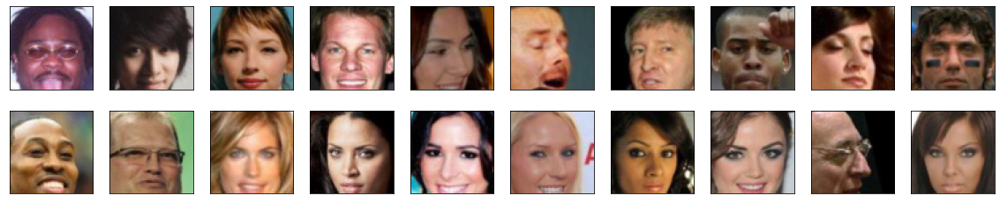

In [6]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [7]:
import torch.nn as nn
from torch.nn import Module

In [8]:
import torch.nn.functional as F

#DCGAN Architechture
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0),
        )
        self.avg_pool = nn.AdaptiveAvgPool2d(1) #Adaptive average pooling to reduce the spatial dimensions to 1x1

    def forward(self, x):
        x = self.model(x)
        x = self.avg_pool(x)
        return x.view(-1, 1, 1, 1)


In [9]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [12]:

class Generator(nn.Module):
    def __init__(self, latent_dimension):
        super(Generator, self).__init__()
        
          #The transposed convolutional layers progressively upsample the input, generating more complex features and structures as the spatial dimensions increase. 
          #The Tanh activation in the last layer ensures that the pixel values are within a valid image range.
        
        self.model = nn.Sequential(
            nn.ConvTranspose2d(latent_dimension, 512, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.model(x)


In [13]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [14]:
import torch.optim as optim

def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # Generator optimizer
    g_optimizer = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))

    # Discriminator optimizer
    d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [15]:
def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. """
    # Generator loss is the negative log likelihood of the discriminator being fooled
    loss = F.binary_cross_entropy_with_logits(fake_logits, torch.ones_like(fake_logits))
    return loss

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [16]:
def discriminator_loss(real_logits, fake_logits):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    # Discriminator loss for real samples
    real_labels = torch.ones_like(real_logits)
    real_loss = F.binary_cross_entropy_with_logits(real_logits, real_labels)

    # Discriminator loss for fake samples
    fake_labels = torch.zeros_like(fake_logits)
    fake_loss = F.binary_cross_entropy_with_logits(fake_logits, fake_labels)

    # Total discriminator loss (combine losses for real and fake samples)
    loss = real_loss + fake_loss
    return loss

In [17]:
# #using Wasserstein distance

# def generator_loss(fake_logits):
#     """ Generator loss using Wasserstein distance. """
#     loss = -1. * torch.mean(fake_logits)
#     return loss

# def discriminator_loss(real_logits, fake_logits):
#     """ Discriminator loss using Wasserstein distance. """
#     loss = torch.mean(fake_logits) - torch.mean(real_logits)
#     return loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [18]:
# I am not applying gradient penalty
#def gradient_penalty(discriminator, real_samples, fake_samples):
#    """ This function enforces """
#    gp = 0
    # TODO (Optional): implement the gradient penalty
#    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [19]:
def generator_step(batch_size: int, latent_dim: int):
    """ One training step of the generator. """
    # Generate fake images
    fake_images = generator(generate_noise(batch_size, latent_dim))

    # Discriminator scores for fake images
    fake_logits = discriminator(fake_images)

    # Generator loss
    g_loss = generator_loss(fake_logits)

    # Backpropagation
    g_optimizer.zero_grad()
    g_loss.backward()
    
    # Optimizer step
    g_optimizer.step()

    return {'loss': g_loss}

def discriminator_step(real_images:torch.Tensor, batch_size: int, latent_dim:int):
    """ One training step of the discriminator. """
    # Generate fake images
    noise = torch.randn(batch_size, latent_dim, 1, 1).to(device)
    fake_images = generator(noise).detach()

    # Discriminator scores for real and fake images
    real_logits = discriminator(real_images)
    fake_logits = discriminator(fake_images)

    # Discriminator loss
    d_loss = discriminator_loss(real_logits, fake_logits)


    # Backpropagation
    d_optimizer.zero_grad()
    d_loss.backward()

    # Optimizer step
    d_optimizer.step()

    return {'loss': d_loss}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [20]:
from datetime import datetime

In [21]:
# dimensions of latent spaces
latent_dim = 128

# to gpu
device = 'cuda'

# number of epochs to train my model
n_epochs = 20

# number of images in each batch
batch_size = 128

In [22]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [23]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2023-11-15 21:23:19 | Epoch [1/20] | Batch 0/509 | d_loss: 1.5180 | g_loss: 0.0000
2023-11-15 21:23:24 | Epoch [1/20] | Batch 50/509 | d_loss: 0.0522 | g_loss: 9.4125
2023-11-15 21:23:29 | Epoch [1/20] | Batch 100/509 | d_loss: 0.0288 | g_loss: 17.0895
2023-11-15 21:23:34 | Epoch [1/20] | Batch 150/509 | d_loss: 0.3037 | g_loss: 7.2929
2023-11-15 21:23:39 | Epoch [1/20] | Batch 200/509 | d_loss: 1.0040 | g_loss: 5.3182
2023-11-15 21:23:44 | Epoch [1/20] | Batch 250/509 | d_loss: 0.7817 | g_loss: 2.4919
2023-11-15 21:23:49 | Epoch [1/20] | Batch 300/509 | d_loss: 0.4156 | g_loss: 4.9691
2023-11-15 21:23:54 | Epoch [1/20] | Batch 350/509 | d_loss: 1.4916 | g_loss: 2.7853
2023-11-15 21:23:59 | Epoch [1/20] | Batch 400/509 | d_loss: 1.1733 | g_loss: 2.5816
2023-11-15 21:24:04 | Epoch [1/20] | Batch 450/509 | d_loss: 0.9008 | g_loss: 2.4295
2023-11-15 21:24:10 | Epoch [1/20] | Batch 500/509 | d_loss: 0.9755 | g_loss: 3.6209


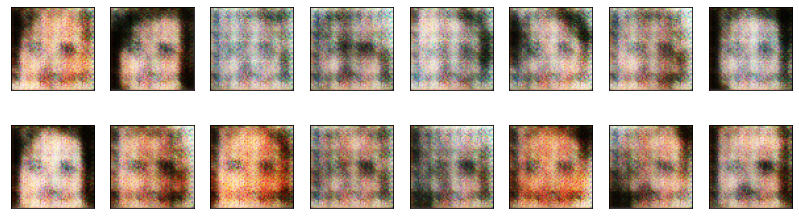

2023-11-15 21:24:14 | Epoch [2/20] | Batch 0/509 | d_loss: 0.9077 | g_loss: 1.6696
2023-11-15 21:24:19 | Epoch [2/20] | Batch 50/509 | d_loss: 1.4999 | g_loss: 1.3843
2023-11-15 21:24:24 | Epoch [2/20] | Batch 100/509 | d_loss: 1.0132 | g_loss: 1.4288
2023-11-15 21:24:29 | Epoch [2/20] | Batch 150/509 | d_loss: 0.7580 | g_loss: 2.7269
2023-11-15 21:24:34 | Epoch [2/20] | Batch 200/509 | d_loss: 1.0767 | g_loss: 3.8947
2023-11-15 21:24:40 | Epoch [2/20] | Batch 250/509 | d_loss: 0.7878 | g_loss: 2.4361
2023-11-15 21:24:45 | Epoch [2/20] | Batch 300/509 | d_loss: 0.9765 | g_loss: 2.1881
2023-11-15 21:24:50 | Epoch [2/20] | Batch 350/509 | d_loss: 0.9115 | g_loss: 3.1554
2023-11-15 21:24:56 | Epoch [2/20] | Batch 400/509 | d_loss: 1.0518 | g_loss: 2.0569
2023-11-15 21:25:01 | Epoch [2/20] | Batch 450/509 | d_loss: 0.9770 | g_loss: 2.0388
2023-11-15 21:25:06 | Epoch [2/20] | Batch 500/509 | d_loss: 1.0541 | g_loss: 3.0943


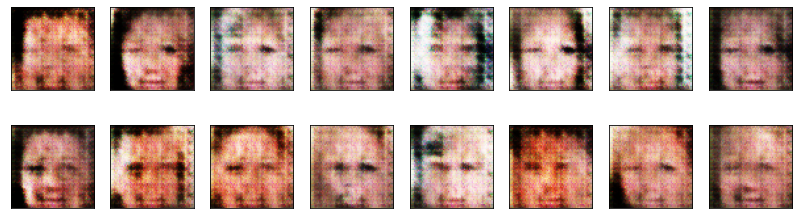

2023-11-15 21:25:10 | Epoch [3/20] | Batch 0/509 | d_loss: 0.8432 | g_loss: 2.6412
2023-11-15 21:25:16 | Epoch [3/20] | Batch 50/509 | d_loss: 0.9351 | g_loss: 2.6058
2023-11-15 21:25:21 | Epoch [3/20] | Batch 100/509 | d_loss: 0.9539 | g_loss: 2.9142
2023-11-15 21:25:26 | Epoch [3/20] | Batch 150/509 | d_loss: 0.9662 | g_loss: 2.5173
2023-11-15 21:25:31 | Epoch [3/20] | Batch 200/509 | d_loss: 0.8676 | g_loss: 3.3260
2023-11-15 21:25:36 | Epoch [3/20] | Batch 250/509 | d_loss: 0.8272 | g_loss: 2.3372
2023-11-15 21:25:42 | Epoch [3/20] | Batch 300/509 | d_loss: 0.8776 | g_loss: 2.5458
2023-11-15 21:25:47 | Epoch [3/20] | Batch 350/509 | d_loss: 1.1071 | g_loss: 3.2065
2023-11-15 21:25:52 | Epoch [3/20] | Batch 400/509 | d_loss: 0.8501 | g_loss: 2.5785
2023-11-15 21:25:58 | Epoch [3/20] | Batch 450/509 | d_loss: 1.0727 | g_loss: 2.0131
2023-11-15 21:26:03 | Epoch [3/20] | Batch 500/509 | d_loss: 1.1099 | g_loss: 2.9557


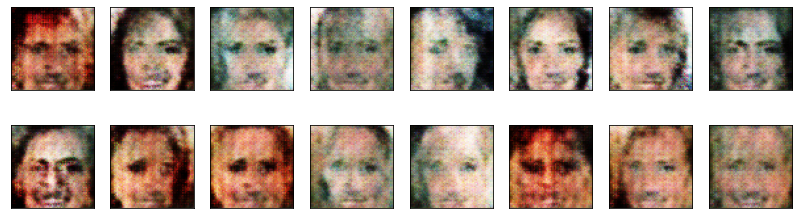

2023-11-15 21:26:07 | Epoch [4/20] | Batch 0/509 | d_loss: 0.6047 | g_loss: 3.9621
2023-11-15 21:26:13 | Epoch [4/20] | Batch 50/509 | d_loss: 0.8451 | g_loss: 2.3512
2023-11-15 21:26:18 | Epoch [4/20] | Batch 100/509 | d_loss: 1.1233 | g_loss: 2.0030
2023-11-15 21:26:23 | Epoch [4/20] | Batch 150/509 | d_loss: 0.9243 | g_loss: 2.4180
2023-11-15 21:26:28 | Epoch [4/20] | Batch 200/509 | d_loss: 1.1537 | g_loss: 2.6309
2023-11-15 21:26:34 | Epoch [4/20] | Batch 250/509 | d_loss: 1.1089 | g_loss: 2.0460
2023-11-15 21:26:39 | Epoch [4/20] | Batch 300/509 | d_loss: 1.0457 | g_loss: 2.6518
2023-11-15 21:26:44 | Epoch [4/20] | Batch 350/509 | d_loss: 0.9369 | g_loss: 2.5400
2023-11-15 21:26:50 | Epoch [4/20] | Batch 400/509 | d_loss: 1.0417 | g_loss: 2.5050
2023-11-15 21:26:55 | Epoch [4/20] | Batch 450/509 | d_loss: 1.4543 | g_loss: 3.5786
2023-11-15 21:27:00 | Epoch [4/20] | Batch 500/509 | d_loss: 1.0859 | g_loss: 3.7795


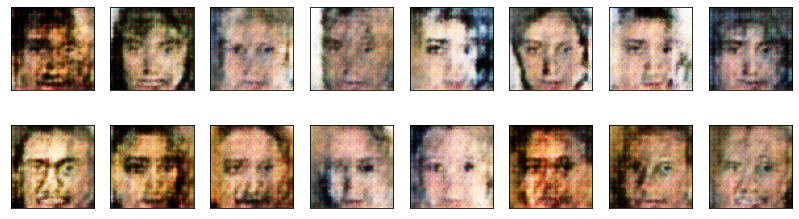

2023-11-15 21:27:05 | Epoch [5/20] | Batch 0/509 | d_loss: 0.4719 | g_loss: 2.7588
2023-11-15 21:27:11 | Epoch [5/20] | Batch 50/509 | d_loss: 0.9401 | g_loss: 2.5282
2023-11-15 21:27:16 | Epoch [5/20] | Batch 100/509 | d_loss: 1.0385 | g_loss: 3.1861
2023-11-15 21:27:21 | Epoch [5/20] | Batch 150/509 | d_loss: 1.1051 | g_loss: 1.5209
2023-11-15 21:27:26 | Epoch [5/20] | Batch 200/509 | d_loss: 0.7917 | g_loss: 2.5174
2023-11-15 21:27:32 | Epoch [5/20] | Batch 250/509 | d_loss: 0.9105 | g_loss: 2.5516
2023-11-15 21:27:37 | Epoch [5/20] | Batch 300/509 | d_loss: 1.0790 | g_loss: 2.6615
2023-11-15 21:27:42 | Epoch [5/20] | Batch 350/509 | d_loss: 0.9116 | g_loss: 2.7737
2023-11-15 21:27:48 | Epoch [5/20] | Batch 400/509 | d_loss: 1.0018 | g_loss: 2.0652
2023-11-15 21:27:53 | Epoch [5/20] | Batch 450/509 | d_loss: 0.8924 | g_loss: 2.2932
2023-11-15 21:27:58 | Epoch [5/20] | Batch 500/509 | d_loss: 0.8415 | g_loss: 2.2722


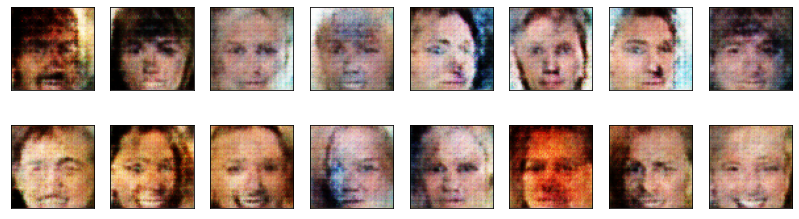

2023-11-15 21:28:03 | Epoch [6/20] | Batch 0/509 | d_loss: 1.8232 | g_loss: 0.4951
2023-11-15 21:28:09 | Epoch [6/20] | Batch 50/509 | d_loss: 0.7520 | g_loss: 2.3294
2023-11-15 21:28:14 | Epoch [6/20] | Batch 100/509 | d_loss: 0.9541 | g_loss: 2.4212
2023-11-15 21:28:19 | Epoch [6/20] | Batch 150/509 | d_loss: 0.8572 | g_loss: 3.1398
2023-11-15 21:28:25 | Epoch [6/20] | Batch 200/509 | d_loss: 0.9146 | g_loss: 2.4517
2023-11-15 21:28:30 | Epoch [6/20] | Batch 250/509 | d_loss: 0.9162 | g_loss: 2.0581
2023-11-15 21:28:35 | Epoch [6/20] | Batch 300/509 | d_loss: 2.1457 | g_loss: 0.4664
2023-11-15 21:28:40 | Epoch [6/20] | Batch 350/509 | d_loss: 0.9110 | g_loss: 2.6383
2023-11-15 21:28:46 | Epoch [6/20] | Batch 400/509 | d_loss: 0.8457 | g_loss: 3.4562
2023-11-15 21:28:51 | Epoch [6/20] | Batch 450/509 | d_loss: 0.9502 | g_loss: 2.1722
2023-11-15 21:28:56 | Epoch [6/20] | Batch 500/509 | d_loss: 1.0182 | g_loss: 1.6678


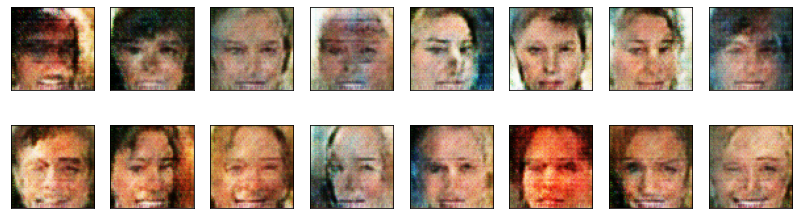

2023-11-15 21:29:01 | Epoch [7/20] | Batch 0/509 | d_loss: 0.5608 | g_loss: 2.0104
2023-11-15 21:29:07 | Epoch [7/20] | Batch 50/509 | d_loss: 1.0284 | g_loss: 2.0322
2023-11-15 21:29:12 | Epoch [7/20] | Batch 100/509 | d_loss: 0.9205 | g_loss: 2.7799
2023-11-15 21:29:17 | Epoch [7/20] | Batch 150/509 | d_loss: 0.8507 | g_loss: 1.9972
2023-11-15 21:29:22 | Epoch [7/20] | Batch 200/509 | d_loss: 0.7998 | g_loss: 2.5424
2023-11-15 21:29:28 | Epoch [7/20] | Batch 250/509 | d_loss: 0.8542 | g_loss: 2.5622
2023-11-15 21:29:33 | Epoch [7/20] | Batch 300/509 | d_loss: 0.7116 | g_loss: 2.5325
2023-11-15 21:29:38 | Epoch [7/20] | Batch 350/509 | d_loss: 1.1104 | g_loss: 1.7513
2023-11-15 21:29:44 | Epoch [7/20] | Batch 400/509 | d_loss: 1.0933 | g_loss: 2.9403
2023-11-15 21:29:49 | Epoch [7/20] | Batch 450/509 | d_loss: 1.1105 | g_loss: 1.7944
2023-11-15 21:29:54 | Epoch [7/20] | Batch 500/509 | d_loss: 0.8310 | g_loss: 1.8373


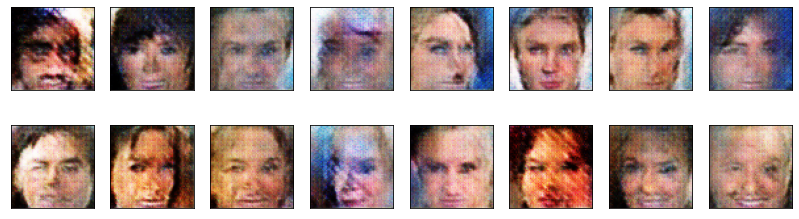

2023-11-15 21:29:58 | Epoch [8/20] | Batch 0/509 | d_loss: 0.5377 | g_loss: 3.4122
2023-11-15 21:30:04 | Epoch [8/20] | Batch 50/509 | d_loss: 1.0391 | g_loss: 1.1835
2023-11-15 21:30:09 | Epoch [8/20] | Batch 100/509 | d_loss: 1.0071 | g_loss: 2.7051
2023-11-15 21:30:14 | Epoch [8/20] | Batch 150/509 | d_loss: 0.8143 | g_loss: 2.5124
2023-11-15 21:30:20 | Epoch [8/20] | Batch 200/509 | d_loss: 0.7535 | g_loss: 2.6981
2023-11-15 21:30:25 | Epoch [8/20] | Batch 250/509 | d_loss: 0.8464 | g_loss: 2.4942
2023-11-15 21:30:30 | Epoch [8/20] | Batch 300/509 | d_loss: 0.9926 | g_loss: 1.6106
2023-11-15 21:30:35 | Epoch [8/20] | Batch 350/509 | d_loss: 1.0867 | g_loss: 2.2148
2023-11-15 21:30:41 | Epoch [8/20] | Batch 400/509 | d_loss: 0.8945 | g_loss: 3.2309
2023-11-15 21:30:46 | Epoch [8/20] | Batch 450/509 | d_loss: 1.0081 | g_loss: 1.6420
2023-11-15 21:30:51 | Epoch [8/20] | Batch 500/509 | d_loss: 1.0758 | g_loss: 3.3442


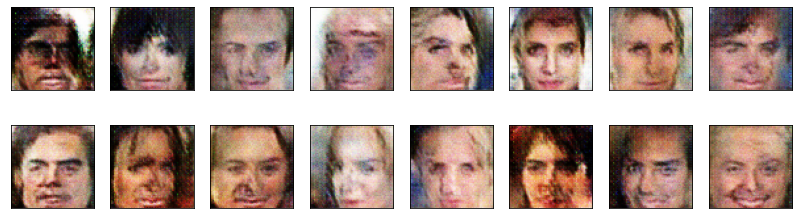

2023-11-15 21:30:56 | Epoch [9/20] | Batch 0/509 | d_loss: 0.7878 | g_loss: 1.7477
2023-11-15 21:31:01 | Epoch [9/20] | Batch 50/509 | d_loss: 0.8117 | g_loss: 1.9959
2023-11-15 21:31:06 | Epoch [9/20] | Batch 100/509 | d_loss: 0.8875 | g_loss: 2.7149
2023-11-15 21:31:12 | Epoch [9/20] | Batch 150/509 | d_loss: 0.8418 | g_loss: 2.9190
2023-11-15 21:31:17 | Epoch [9/20] | Batch 200/509 | d_loss: 1.1030 | g_loss: 1.7810
2023-11-15 21:31:22 | Epoch [9/20] | Batch 250/509 | d_loss: 1.0016 | g_loss: 2.1810
2023-11-15 21:31:28 | Epoch [9/20] | Batch 300/509 | d_loss: 0.7891 | g_loss: 2.5336
2023-11-15 21:31:33 | Epoch [9/20] | Batch 350/509 | d_loss: 1.1953 | g_loss: 2.2923
2023-11-15 21:31:38 | Epoch [9/20] | Batch 400/509 | d_loss: 1.0270 | g_loss: 1.9027
2023-11-15 21:31:43 | Epoch [9/20] | Batch 450/509 | d_loss: 1.0383 | g_loss: 1.9462
2023-11-15 21:31:49 | Epoch [9/20] | Batch 500/509 | d_loss: 0.8310 | g_loss: 2.2139


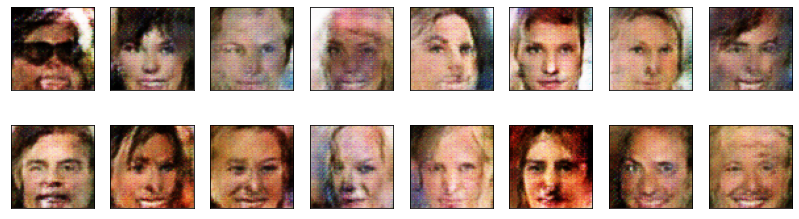

2023-11-15 21:31:53 | Epoch [10/20] | Batch 0/509 | d_loss: 0.6688 | g_loss: 2.2300
2023-11-15 21:31:58 | Epoch [10/20] | Batch 50/509 | d_loss: 0.9571 | g_loss: 3.0807
2023-11-15 21:32:04 | Epoch [10/20] | Batch 100/509 | d_loss: 0.9290 | g_loss: 2.1975
2023-11-15 21:32:09 | Epoch [10/20] | Batch 150/509 | d_loss: 1.0569 | g_loss: 1.8881
2023-11-15 21:32:14 | Epoch [10/20] | Batch 200/509 | d_loss: 1.2188 | g_loss: 1.3440
2023-11-15 21:32:19 | Epoch [10/20] | Batch 250/509 | d_loss: 0.8529 | g_loss: 2.5638
2023-11-15 21:32:25 | Epoch [10/20] | Batch 300/509 | d_loss: 0.8008 | g_loss: 2.8197
2023-11-15 21:32:30 | Epoch [10/20] | Batch 350/509 | d_loss: 1.5132 | g_loss: 4.0734
2023-11-15 21:32:35 | Epoch [10/20] | Batch 400/509 | d_loss: 0.9059 | g_loss: 2.3430
2023-11-15 21:32:41 | Epoch [10/20] | Batch 450/509 | d_loss: 0.9873 | g_loss: 3.0381
2023-11-15 21:32:46 | Epoch [10/20] | Batch 500/509 | d_loss: 1.2836 | g_loss: 3.9455


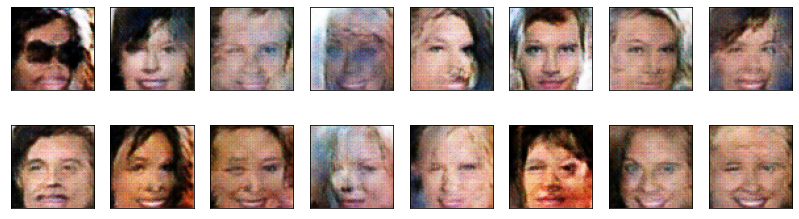

2023-11-15 21:32:51 | Epoch [11/20] | Batch 0/509 | d_loss: 0.9548 | g_loss: 1.8365
2023-11-15 21:32:56 | Epoch [11/20] | Batch 50/509 | d_loss: 1.1219 | g_loss: 2.8877
2023-11-15 21:33:01 | Epoch [11/20] | Batch 100/509 | d_loss: 0.7499 | g_loss: 2.1690
2023-11-15 21:33:07 | Epoch [11/20] | Batch 150/509 | d_loss: 0.9605 | g_loss: 1.8175
2023-11-15 21:33:12 | Epoch [11/20] | Batch 200/509 | d_loss: 0.9431 | g_loss: 1.6321
2023-11-15 21:33:17 | Epoch [11/20] | Batch 250/509 | d_loss: 1.0641 | g_loss: 1.6628
2023-11-15 21:33:22 | Epoch [11/20] | Batch 300/509 | d_loss: 1.2285 | g_loss: 1.3833
2023-11-15 21:33:28 | Epoch [11/20] | Batch 350/509 | d_loss: 1.0043 | g_loss: 2.5734
2023-11-15 21:33:33 | Epoch [11/20] | Batch 400/509 | d_loss: 1.0265 | g_loss: 2.2926
2023-11-15 21:33:38 | Epoch [11/20] | Batch 450/509 | d_loss: 1.0121 | g_loss: 1.7187
2023-11-15 21:33:44 | Epoch [11/20] | Batch 500/509 | d_loss: 1.5588 | g_loss: 3.4371


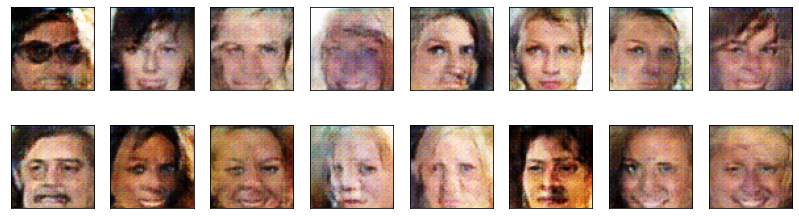

2023-11-15 21:33:49 | Epoch [12/20] | Batch 0/509 | d_loss: 0.4748 | g_loss: 2.3901
2023-11-15 21:33:54 | Epoch [12/20] | Batch 50/509 | d_loss: 1.0964 | g_loss: 2.1330
2023-11-15 21:33:59 | Epoch [12/20] | Batch 100/509 | d_loss: 1.0943 | g_loss: 2.7790
2023-11-15 21:34:04 | Epoch [12/20] | Batch 150/509 | d_loss: 1.0887 | g_loss: 2.3011
2023-11-15 21:34:10 | Epoch [12/20] | Batch 200/509 | d_loss: 0.9576 | g_loss: 2.4169
2023-11-15 21:34:15 | Epoch [12/20] | Batch 250/509 | d_loss: 1.1819 | g_loss: 3.6463
2023-11-15 21:34:20 | Epoch [12/20] | Batch 300/509 | d_loss: 0.9665 | g_loss: 2.0492
2023-11-15 21:34:25 | Epoch [12/20] | Batch 350/509 | d_loss: 1.0409 | g_loss: 2.3782
2023-11-15 21:34:31 | Epoch [12/20] | Batch 400/509 | d_loss: 1.1203 | g_loss: 3.5670
2023-11-15 21:34:36 | Epoch [12/20] | Batch 450/509 | d_loss: 1.1063 | g_loss: 3.3408
2023-11-15 21:34:41 | Epoch [12/20] | Batch 500/509 | d_loss: 1.0440 | g_loss: 1.7614


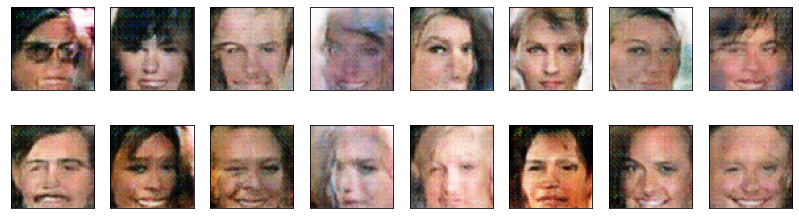

2023-11-15 21:34:45 | Epoch [13/20] | Batch 0/509 | d_loss: 0.7297 | g_loss: 2.6376
2023-11-15 21:34:51 | Epoch [13/20] | Batch 50/509 | d_loss: 0.8843 | g_loss: 1.7348
2023-11-15 21:34:56 | Epoch [13/20] | Batch 100/509 | d_loss: 1.2652 | g_loss: 1.8689
2023-11-15 21:35:01 | Epoch [13/20] | Batch 150/509 | d_loss: 0.9581 | g_loss: 2.8076
2023-11-15 21:35:06 | Epoch [13/20] | Batch 200/509 | d_loss: 1.0366 | g_loss: 1.6809
2023-11-15 21:35:12 | Epoch [13/20] | Batch 250/509 | d_loss: 1.0061 | g_loss: 2.2847
2023-11-15 21:35:17 | Epoch [13/20] | Batch 300/509 | d_loss: 0.7934 | g_loss: 2.5842
2023-11-15 21:35:22 | Epoch [13/20] | Batch 350/509 | d_loss: 0.9752 | g_loss: 2.3858
2023-11-15 21:35:27 | Epoch [13/20] | Batch 400/509 | d_loss: 1.2323 | g_loss: 2.0725
2023-11-15 21:35:33 | Epoch [13/20] | Batch 450/509 | d_loss: 0.9892 | g_loss: 1.6534
2023-11-15 21:35:38 | Epoch [13/20] | Batch 500/509 | d_loss: 1.4535 | g_loss: 1.0794


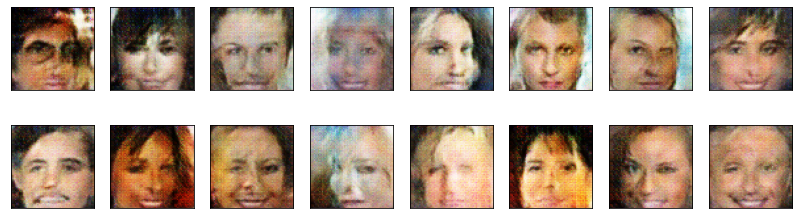

2023-11-15 21:35:42 | Epoch [14/20] | Batch 0/509 | d_loss: 0.5998 | g_loss: 2.9617
2023-11-15 21:35:47 | Epoch [14/20] | Batch 50/509 | d_loss: 1.3087 | g_loss: 1.2642
2023-11-15 21:35:53 | Epoch [14/20] | Batch 100/509 | d_loss: 0.8274 | g_loss: 1.8429
2023-11-15 21:35:58 | Epoch [14/20] | Batch 150/509 | d_loss: 1.1005 | g_loss: 2.5645
2023-11-15 21:36:03 | Epoch [14/20] | Batch 200/509 | d_loss: 1.0305 | g_loss: 3.0450
2023-11-15 21:36:08 | Epoch [14/20] | Batch 250/509 | d_loss: 1.0450 | g_loss: 1.1506
2023-11-15 21:36:14 | Epoch [14/20] | Batch 300/509 | d_loss: 0.9456 | g_loss: 2.4802
2023-11-15 21:36:19 | Epoch [14/20] | Batch 350/509 | d_loss: 0.9709 | g_loss: 2.3013
2023-11-15 21:36:24 | Epoch [14/20] | Batch 400/509 | d_loss: 1.0242 | g_loss: 2.2719
2023-11-15 21:36:30 | Epoch [14/20] | Batch 450/509 | d_loss: 1.1070 | g_loss: 1.2535
2023-11-15 21:36:35 | Epoch [14/20] | Batch 500/509 | d_loss: 1.0965 | g_loss: 2.5544


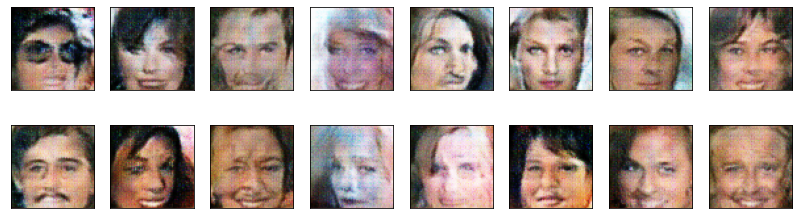

2023-11-15 21:36:39 | Epoch [15/20] | Batch 0/509 | d_loss: 0.9711 | g_loss: 1.4011
2023-11-15 21:36:45 | Epoch [15/20] | Batch 50/509 | d_loss: 0.8555 | g_loss: 2.0878
2023-11-15 21:36:50 | Epoch [15/20] | Batch 100/509 | d_loss: 0.8777 | g_loss: 2.1065
2023-11-15 21:36:55 | Epoch [15/20] | Batch 150/509 | d_loss: 0.8590 | g_loss: 2.6558
2023-11-15 21:37:01 | Epoch [15/20] | Batch 200/509 | d_loss: 0.8974 | g_loss: 3.1201
2023-11-15 21:37:06 | Epoch [15/20] | Batch 250/509 | d_loss: 0.9177 | g_loss: 2.6326
2023-11-15 21:37:11 | Epoch [15/20] | Batch 300/509 | d_loss: 1.5541 | g_loss: 0.9098
2023-11-15 21:37:16 | Epoch [15/20] | Batch 350/509 | d_loss: 0.9970 | g_loss: 1.9495
2023-11-15 21:37:22 | Epoch [15/20] | Batch 400/509 | d_loss: 1.3080 | g_loss: 0.9844
2023-11-15 21:37:27 | Epoch [15/20] | Batch 450/509 | d_loss: 1.1396 | g_loss: 1.9468
2023-11-15 21:37:32 | Epoch [15/20] | Batch 500/509 | d_loss: 1.2987 | g_loss: 3.6005


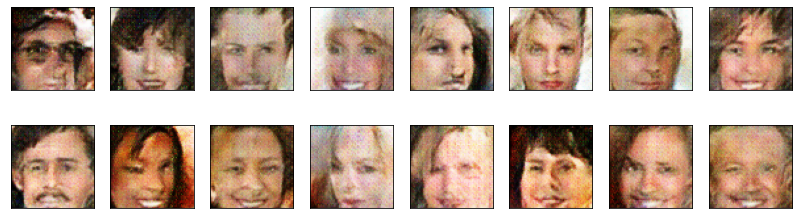

2023-11-15 21:37:37 | Epoch [16/20] | Batch 0/509 | d_loss: 0.7806 | g_loss: 1.7096
2023-11-15 21:37:42 | Epoch [16/20] | Batch 50/509 | d_loss: 0.9913 | g_loss: 2.6598
2023-11-15 21:37:47 | Epoch [16/20] | Batch 100/509 | d_loss: 0.7827 | g_loss: 2.4695
2023-11-15 21:37:52 | Epoch [16/20] | Batch 150/509 | d_loss: 1.0147 | g_loss: 1.4958
2023-11-15 21:37:58 | Epoch [16/20] | Batch 200/509 | d_loss: 0.8850 | g_loss: 1.9280
2023-11-15 21:38:03 | Epoch [16/20] | Batch 250/509 | d_loss: 0.9633 | g_loss: 2.0520
2023-11-15 21:38:08 | Epoch [16/20] | Batch 300/509 | d_loss: 0.6160 | g_loss: 2.3251
2023-11-15 21:38:13 | Epoch [16/20] | Batch 350/509 | d_loss: 0.9111 | g_loss: 2.2266
2023-11-15 21:38:19 | Epoch [16/20] | Batch 400/509 | d_loss: 0.8738 | g_loss: 2.1298
2023-11-15 21:38:24 | Epoch [16/20] | Batch 450/509 | d_loss: 1.0016 | g_loss: 1.6214
2023-11-15 21:38:29 | Epoch [16/20] | Batch 500/509 | d_loss: 1.0437 | g_loss: 2.7161


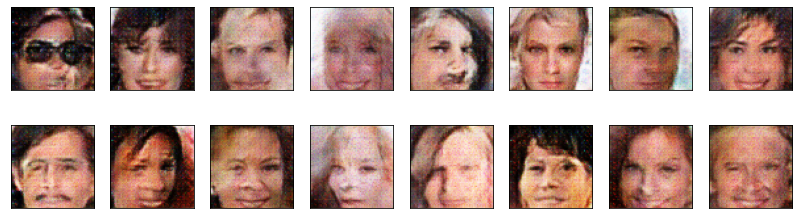

2023-11-15 21:38:34 | Epoch [17/20] | Batch 0/509 | d_loss: 0.4806 | g_loss: 1.9061
2023-11-15 21:38:39 | Epoch [17/20] | Batch 50/509 | d_loss: 0.9314 | g_loss: 1.8784
2023-11-15 21:38:45 | Epoch [17/20] | Batch 100/509 | d_loss: 1.0785 | g_loss: 1.4204
2023-11-15 21:38:50 | Epoch [17/20] | Batch 150/509 | d_loss: 1.2300 | g_loss: 3.1074
2023-11-15 21:38:55 | Epoch [17/20] | Batch 200/509 | d_loss: 1.1194 | g_loss: 2.2470
2023-11-15 21:39:00 | Epoch [17/20] | Batch 250/509 | d_loss: 0.9259 | g_loss: 2.8316
2023-11-15 21:39:06 | Epoch [17/20] | Batch 300/509 | d_loss: 1.5691 | g_loss: 4.3136
2023-11-15 21:39:11 | Epoch [17/20] | Batch 350/509 | d_loss: 1.1604 | g_loss: 2.8622
2023-11-15 21:39:16 | Epoch [17/20] | Batch 400/509 | d_loss: 0.9495 | g_loss: 1.9497
2023-11-15 21:39:22 | Epoch [17/20] | Batch 450/509 | d_loss: 1.0139 | g_loss: 1.8875
2023-11-15 21:39:27 | Epoch [17/20] | Batch 500/509 | d_loss: 1.0894 | g_loss: 2.7295


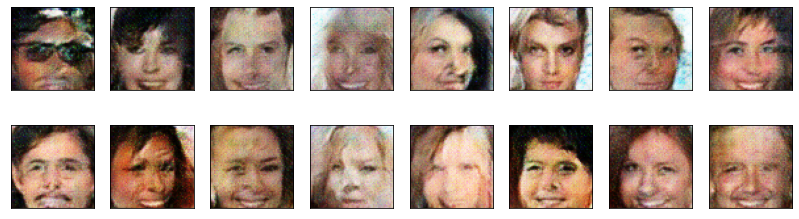

2023-11-15 21:39:32 | Epoch [18/20] | Batch 0/509 | d_loss: 0.5682 | g_loss: 2.6811
2023-11-15 21:39:37 | Epoch [18/20] | Batch 50/509 | d_loss: 0.6637 | g_loss: 3.0412
2023-11-15 21:39:42 | Epoch [18/20] | Batch 100/509 | d_loss: 0.8296 | g_loss: 2.8270
2023-11-15 21:39:48 | Epoch [18/20] | Batch 150/509 | d_loss: 1.1320 | g_loss: 3.1836
2023-11-15 21:39:53 | Epoch [18/20] | Batch 200/509 | d_loss: 0.9805 | g_loss: 3.2432
2023-11-15 21:39:58 | Epoch [18/20] | Batch 250/509 | d_loss: 0.8946 | g_loss: 2.2739
2023-11-15 21:40:03 | Epoch [18/20] | Batch 300/509 | d_loss: 0.9634 | g_loss: 2.7127
2023-11-15 21:40:09 | Epoch [18/20] | Batch 350/509 | d_loss: 0.9011 | g_loss: 2.8453
2023-11-15 21:40:14 | Epoch [18/20] | Batch 400/509 | d_loss: 1.1902 | g_loss: 1.4903
2023-11-15 21:40:19 | Epoch [18/20] | Batch 450/509 | d_loss: 0.7592 | g_loss: 2.5372
2023-11-15 21:40:25 | Epoch [18/20] | Batch 500/509 | d_loss: 1.0300 | g_loss: 1.4508


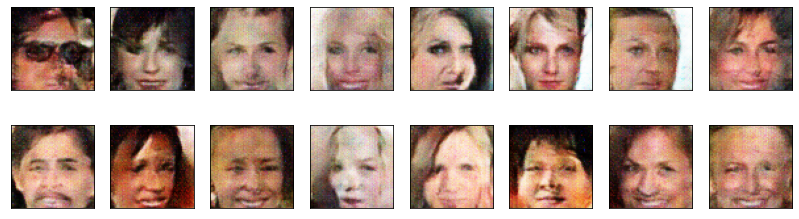

2023-11-15 21:40:30 | Epoch [19/20] | Batch 0/509 | d_loss: 0.5053 | g_loss: 2.2258
2023-11-15 21:40:35 | Epoch [19/20] | Batch 50/509 | d_loss: 0.9161 | g_loss: 2.8760
2023-11-15 21:40:40 | Epoch [19/20] | Batch 100/509 | d_loss: 0.8386 | g_loss: 2.0183
2023-11-15 21:40:45 | Epoch [19/20] | Batch 150/509 | d_loss: 1.0745 | g_loss: 1.4126
2023-11-15 21:40:50 | Epoch [19/20] | Batch 200/509 | d_loss: 0.9092 | g_loss: 1.7435
2023-11-15 21:40:56 | Epoch [19/20] | Batch 250/509 | d_loss: 0.9228 | g_loss: 1.7203
2023-11-15 21:41:01 | Epoch [19/20] | Batch 300/509 | d_loss: 1.0973 | g_loss: 3.0382
2023-11-15 21:41:06 | Epoch [19/20] | Batch 350/509 | d_loss: 1.0417 | g_loss: 2.7823
2023-11-15 21:41:12 | Epoch [19/20] | Batch 400/509 | d_loss: 0.6727 | g_loss: 2.4448
2023-11-15 21:41:17 | Epoch [19/20] | Batch 450/509 | d_loss: 0.6949 | g_loss: 2.4277
2023-11-15 21:41:22 | Epoch [19/20] | Batch 500/509 | d_loss: 0.8720 | g_loss: 2.4999


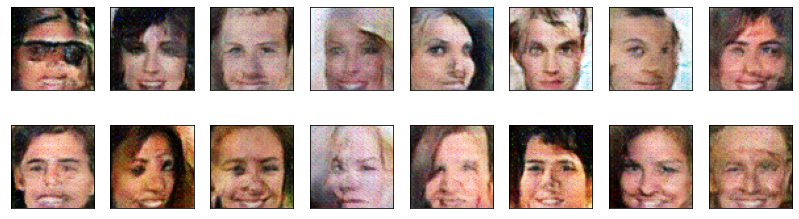

2023-11-15 21:41:26 | Epoch [20/20] | Batch 0/509 | d_loss: 0.6442 | g_loss: 1.9649
2023-11-15 21:41:31 | Epoch [20/20] | Batch 50/509 | d_loss: 1.3862 | g_loss: 1.6352
2023-11-15 21:41:36 | Epoch [20/20] | Batch 100/509 | d_loss: 0.6667 | g_loss: 2.9602
2023-11-15 21:41:42 | Epoch [20/20] | Batch 150/509 | d_loss: 0.9501 | g_loss: 1.3744
2023-11-15 21:41:47 | Epoch [20/20] | Batch 200/509 | d_loss: 1.1254 | g_loss: 1.2411
2023-11-15 21:41:52 | Epoch [20/20] | Batch 250/509 | d_loss: 0.8556 | g_loss: 1.9153
2023-11-15 21:41:57 | Epoch [20/20] | Batch 300/509 | d_loss: 0.9421 | g_loss: 3.3039
2023-11-15 21:42:03 | Epoch [20/20] | Batch 350/509 | d_loss: 1.1757 | g_loss: 1.4651
2023-11-15 21:42:08 | Epoch [20/20] | Batch 400/509 | d_loss: 0.8411 | g_loss: 2.4124
2023-11-15 21:42:13 | Epoch [20/20] | Batch 450/509 | d_loss: 1.6117 | g_loss: 0.7617
2023-11-15 21:42:18 | Epoch [20/20] | Batch 500/509 | d_loss: 0.8923 | g_loss: 2.4402


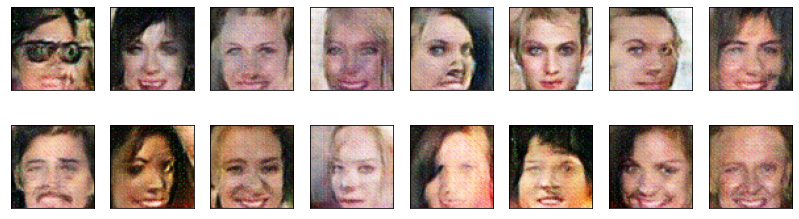

In [24]:
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().cuda()

losses = []
g_loss = 0.0  # Initialize g_loss

def generate_noise(batch_size, latent_dim):
    return torch.randn(batch_size, latent_dim, 1, 1).float().cuda()


for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)
        
        ####################################
        # Training Strategy
        ####################################
        
        # Train the discriminator more often than the generator
        if batch_i % 2 == 0:
            noise_factor = 0.1  # Added noise to the input image
            real_images += noise_factor * torch.randn_like(real_images)

            # Discriminator step
            d_loss = discriminator_step( real_images, batch_size, latent_dim)

        else:
            # Generator step
            g_loss = generator_step(batch_size, latent_dim)

        ####################################
        
        if batch_i % print_every == 0:
            # Append discriminator loss and generator loss
            d = d_loss if isinstance(d_loss, float) else d_loss['loss'].item()
            g = g_loss if isinstance(g_loss, float) else g_loss['loss'].item()
            losses.append((d, g))
            
            # Print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')

    # Display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()


### Training losses

Plot the training losses for the generator and discriminator.

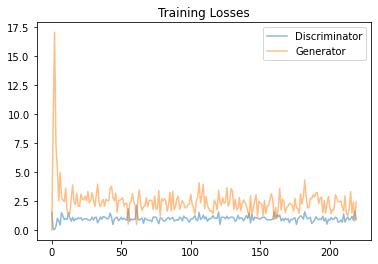

In [25]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** (
The training datasets primarily consist of images featuring white celebrities, leading to a bias in the model towards this demographic. To address this, it is crucial to augment the dataset with more images of black, brown, and Asian celebrities, ensuring a more diverse representation. Training the model with these new datasets can significantly enhance its performance. Additionally, considering face labels such as male and female can further contribute to improved model accuracy.

I experimented with different training configurations, varying the epoch number and batch size. Training the model with epoch sizes of 5, 10, and 20, along with batch sizes of 32, 64, and 128, revealed that higher epoch numbers (e.g., 20) and larger batch sizes (e.g., 128) result in more favorable losses.

I implemented two distinct loss functions, Binary Cross Entropy (BCE) and Wasserstein distance. Upon evaluation, it appears that BCE is more effective for training this project, providing better outcomes and model performance.

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.